## Clothes Items Image Object Detection & Reverse Image Search


The goal of this project is to create models detecting clothes items in the image and finding similar images in the database. It could be used as a convenient feature in the online clothes shop.

This project consists of 4 main parts:
* dataset preparation
* object detection model - we will use implementation of YoloV3 in TensorFlow 2.0 provided by https://github.com/zzh8829/yolov3-tf2.
* reverse image search model - we will use pretrained model Xception and loss TripletSemiHardLoss.
* testing models on test images

Initial experiments were made using one dataset only. However, to improve results, additional data was added from other datasets. 

Due to the datasets are nbalanced and category naming des not match, this notebook contains a lot of data preprocessing.

We will use datasets from these databases:

[Large-scale Fashion (DeepFashion) Database](http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion.html)
```
@inproceedings{liuLQWTcvpr16DeepFashion,
 author = {Liu, Ziwei and Luo, Ping and Qiu, Shi and Wang, Xiaogang and Tang, Xiaoou},
 title = {DeepFashion: Powering Robust Clothes Recognition and Retrieval with Rich Annotations},
 booktitle = {Proceedings of IEEE Conference on Computer Vision and Pattern Recognition (CVPR)},
 month = {June},
 year = {2016} 
 }
 ```

 [DeepFashion2 Dataset](https://github.com/switchablenorms/DeepFashion2)
```
@article{DeepFashion2,
  author = {Yuying Ge and Ruimao Zhang and Lingyun Wu and Xiaogang Wang and Xiaoou Tang and Ping Luo},
  title={A Versatile Benchmark for Detection, Pose Estimation, Segmentation and Re-Identification of Clothing Images},
  journal={CVPR},
  year={2019}
}
```
 
Password protected Datasets are provided in Google Drive. In order not to disclose passwords data unzip part is not shown in this notebook.

We made several trainings using different sets of datasets and parameters.

Only the best models are presented.

## Setup & Imports

In [0]:
import os

try:
    %tensorflow_version 2.x
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    %matplotlib inline
except:
    %load_ext lab_black
    os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
    os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [0]:
!pip install -q -U toai

In [0]:
print(__import__('toai').__version__)

0.5.1


In [0]:
print(__import__('tensorflow').__version__)

2.1.0


In [0]:
from toai.imports import *
from toai.image import ImageAugmentor, ImageParser, ImageResizer, ImageLearner
from toai.data.utils import split_df
from typing import *
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models  import load_model
from tensorflow.keras.models import model_from_json
from glob import glob
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
import tensorflow_addons as tfa
import random
import cv2
import json
import gc
gc.enable()

%matplotlib inline

In [0]:
DATA_DIR = Path('data/fashion')
DATA_DIR.mkdir(parents=True, exist_ok=True)

In [0]:
TEMP_DIR = Path('/content/drive/My Drive/18_CP_Fashion/temp/fashion')

In [0]:
font = ImageFont.truetype(TEMP_DIR/'Roboto-Bold.ttf', size=18)

## Data Preparation

### 1st Dataset - DeepFashion2 

DeepFashion2 contains 491K diverse images of 13 popular clothing categories from both commercial shopping stores and consumers.

The dataset is split into a training set (391K images), a validation set (34k images), and a test set (67k images).

Each image in seperate image set has a unique six-digit number such as 000001.jpg. A corresponding annotation file in json format is provided in annotation set such as 000001.json.

One image can have several bounding boxes.

Do to the lack of computing resources, we will use validation set only.

#### DataFrame from json

In [0]:
with open(DATA_DIR/'validation/annos/000999.json', 'r') as j:
    json_data = json.load(j)
    print(json.dumps(json_data, indent=8, sort_keys=False))

{
        "source": "user",
        "pair_id": 218,
        "item1": {
                "segmentation": [
                        [
                                92.67734018264842,
                                32.676636225266364,
                                107.60789573820409,
                                26.947469558599657,
                                122.79754566210055,
                                21.616933028919345,
                                138.7697678843229,
                                14.498877473363734,
                                146.58226788432296,
                                16.23498858447486,
                                148.14476788432296,
                                21.96415525114157,
                                151.09615677321187,
                                22.83221080669713,
                                154.91560121765633,
                                26.825266362252716,
                                158.561434

In [0]:
dfs = []

In [0]:
for filename in progress_bar(sorted(glob(str(DATA_DIR / 'validation/annos/**/*.json'), recursive=True))):
    with open(filename, 'r') as j:
        json_data = json.load(j)
    json_df = pd.DataFrame(json_data).T

    json_df['source'], json_df['pair_id'] =  json_data['source'], json_data['pair_id']
    json_df.drop(['source', 'pair_id'], axis=0, inplace=True)
    json_df.drop(['landmarks', 'segmentation'], axis=1, inplace=True)
    json_df[['x1','y1', 'x2', 'y2']] = pd.DataFrame(json_df.bounding_box.values.tolist(), index=json_df.index)
    json_df.drop(['bounding_box'], axis=1, inplace=True)
    json_df['file_name'] = os.path.basename(filename)
    json_df['file_path'] = filename
    dfs.append(json_df)

In [0]:
df = pd.concat(dfs,sort=False).reset_index()

In [0]:
df.head(3)

,index,scale,viewpoint,zoom_in,style,category_id,occlusion,category_name,source,pair_id,x1,y1,x2,y2,file_name,file_path
0,item2,1,2,1,2,13,2,sling dress,user,1,204,189,293,414,000001.json,data/fashion/validation/annos/000001.json
1,item1,1,2,1,1,5,2,vest,user,1,199,190,287,269,000001.json,data/fashion/validation/annos/000001.json
2,item2,2,2,1,2,13,2,sling dress,user,1,176,120,292,383,000002.json,data/fashion/validation/annos/000002.json


In [0]:
df.sample(3)

,index,scale,viewpoint,zoom_in,style,category_id,occlusion,category_name,source,pair_id,x1,y1,x2,y2,file_name,file_path
46529,item1,2,2,1,5,1,1,short sleeve top,shop,2003,202,301,544,741,028772.json,data/fashion/validation/annos/028772.json
34247,item2,1,2,1,0,1,1,short sleeve top,shop,1223,286,0,532,150,021659.json,data/fashion/validation/annos/021659.json
40257,item1,1,3,1,1,12,2,vest dress,shop,1585,254,95,392,390,025118.json,data/fashion/validation/annos/025118.json


In [0]:
df.tail(3)

,index,scale,viewpoint,zoom_in,style,category_id,occlusion,category_name,source,pair_id,x1,y1,x2,y2,file_name,file_path
52487,item1,2,2,1,1,11,1,long sleeve dress,shop,2372,358,645,801,1247,032151.json,data/fashion/validation/annos/032151.json
52488,item1,2,2,1,1,11,1,long sleeve dress,shop,2372,196,469,674,1221,032152.json,data/fashion/validation/annos/032152.json
52489,item1,3,2,1,1,11,1,long sleeve dress,shop,2372,57,139,376,631,032153.json,data/fashion/validation/annos/032153.json


In [0]:
df['image_name'] = df['file_name']

In [0]:
df.image_name.replace({'json':'jpg'}, regex=True, inplace=True)

In [0]:
df.file_path.replace({'image':'json'}, regex=True, inplace=True)

In [0]:
df['image_path'] = f'{DATA_DIR}/validation/image/'  + df['image_name']

In [0]:
def get_image_dims(arr):
    heights, widths = [], []
    for filename in progress_bar(arr):
        height, width, _ = np.array(keras.preprocessing.image.load_img(filename)).shape
        heights.append(height)
        widths.append(width)
    return  np.asarray(widths),np.asarray(heights)

In [0]:
df[['width', 'height']] = pd.DataFrame(get_image_dims(df['image_path'])).T

In [0]:
df.rename(columns={'x1': 'xmin', 'y1':'ymin', 'x2': 'xmax', 'y2':'ymax'}, inplace=True)

In [0]:
df.head()

,index,scale,viewpoint,zoom_in,style,category_id,occlusion,category_name,source,pair_id,xmin,ymin,xmax,ymax,file_name,file_path,image_name,image_path,width,height
0,item2,1,2,1,2,13,2,sling dress,user,1,204,189,293,414,000001.json,data/fashion/validation/json/000001.json,000001.jpg,data/fashion/validation/image/000001.jpg,468,624
1,item1,1,2,1,1,5,2,vest,user,1,199,190,287,269,000001.json,data/fashion/validation/json/000001.json,000001.jpg,data/fashion/validation/image/000001.jpg,468,624
2,item2,2,2,1,2,13,2,sling dress,user,1,176,120,292,383,000002.json,data/fashion/validation/json/000002.json,000002.jpg,data/fashion/validation/image/000002.jpg,468,624
3,item1,1,2,1,1,5,2,vest,user,1,170,121,280,215,000002.json,data/fashion/validation/json/000002.json,000002.jpg,data/fashion/validation/image/000002.jpg,468,624
4,item1,1,2,1,1,10,2,short sleeve dress,user,3,151,241,279,435,000003.json,data/fashion/validation/json/000003.json,000003.jpg,data/fashion/validation/image/000003.jpg,468,628


In [0]:
df.to_csv(TEMP_DIR/'df_full_validation.csv', index=False)

#### EDA

In [0]:
df = pd.read_csv(TEMP_DIR/'df_full_validation.csv', low_memory=False)

In [0]:
# Total number of records
df.shape

(52490, 20)

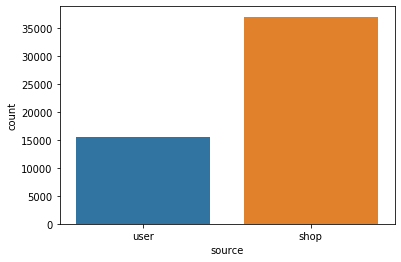

In [0]:
ax = sns.countplot(x='source', data=df)

In [0]:
# Unique images
df['image_name'].nunique()

32153

In [0]:
df.groupby('source')['image_name'].nunique().reset_index()

,source,image_name
0,shop,21309
1,user,10844


In validation set, the first 10844 images are from consumers and the last 20681 images are from shops.

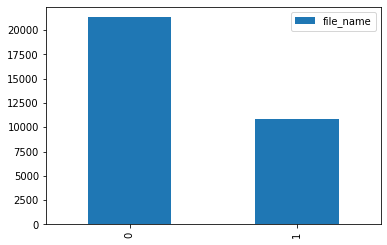

In [0]:
df.groupby('source')['image_name'].nunique().reset_index().plot(kind='bar',use_index =False)

In [0]:
number_by_cat = df.groupby(['category_id', 'category_name'])['image_name'].nunique().reset_index()

In [0]:
number_by_cat

,category_id,category_name,image_name
0,1,short sleeve top,12371
1,2,long sleeve top,5916
2,3,short sleeve outwear,142
3,4,long sleeve outwear,1999
4,5,vest,2098
5,6,sling,317
6,7,shorts,4133
7,8,trousers,9494
8,9,skirt,6499
9,10,short sleeve dress,3076


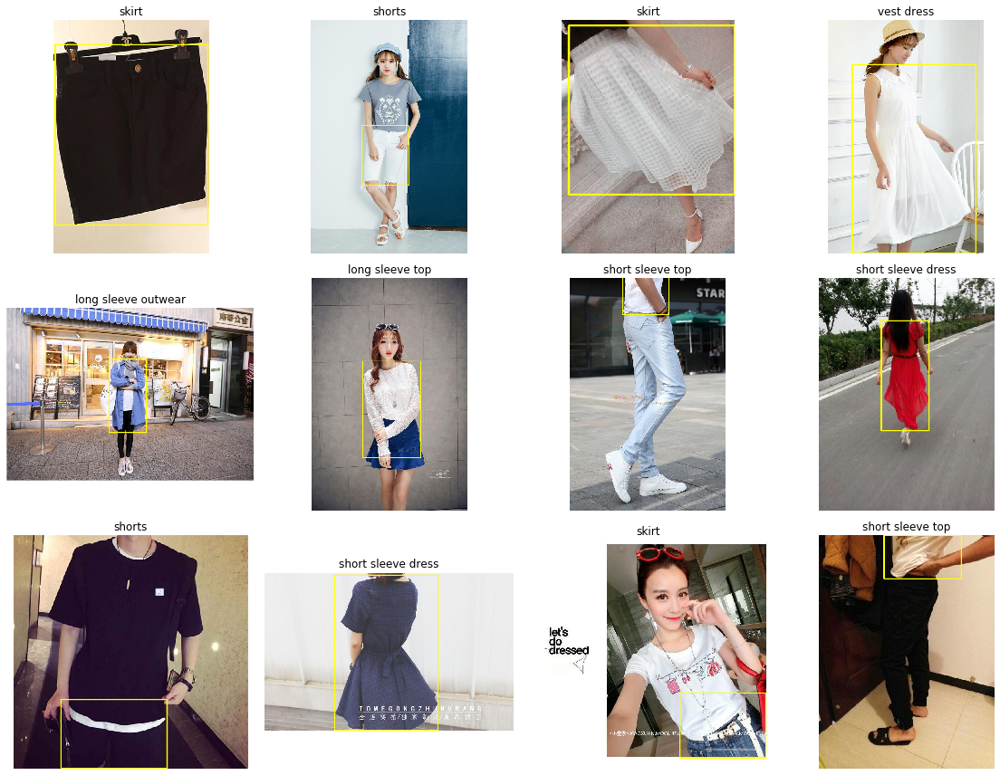

In [0]:
plot_df_images(df, 'image_path', 'category_name')

### 2nd Dataset - DeepFashion - Category and Attribute Dataset

This is a large subset of DeepFashion, containing massive descriptive clothing categories and attributes. It contains

289,222 number of clothes images;

50 number of clothing categories;

Each image is annotated by bounding box and clothing type (bottom, top, long).

There is one bounding box per image.

#### DataFrame from Multiple Annotation Files. EDA


In [0]:
# Combining annotanion files
category_cloth = str(DATA_DIR/'Anno/list_category_cloth.txt')
category_img = str(DATA_DIR/'Anno/list_category_img.txt')
bbox = str(DATA_DIR/'Anno/list_bbox.txt')
eval_partition = str(DATA_DIR/'Anno/list_eval_partition.txt')

In [0]:
df_category = pd.read_csv(category_cloth, sep=r'\s{1,}', skiprows=1, engine='python')

In [0]:
df_category.head()

,category_name,category_type
0,Anorak,1
1,Blazer,1
2,Blouse,1
3,Bomber,1
4,Button-Down,1


In [0]:
df_category.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 2 columns):
category_name    50 non-null object
category_type    50 non-null int64
dtypes: int64(1), object(1)
memory usage: 928.0+ bytes


In [0]:
df_category['category_label'] = np.arange(len(dt_category)) + 1

In [0]:
df_category.category_label.values

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50])

In [0]:
df_img = pd.read_csv(category_img, sep=r'\s{1,}', skiprows=2, engine='python', header=None,
                     names=['image_name', 'category_label'])

In [0]:
df_img.head()

,image_name,category_label
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,3
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,3
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,3
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,3
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,3


In [0]:
df_bbox = pd.read_csv(bbox, sep=r'\s{1,}', skiprows=2, engine='python', header=None,
                      names=['image_name', 'xmin', 'ymin', 'xmax', 'ymax'])

In [0]:
df_partition = pd.read_csv(eval_partition, skiprows=2, sep=r'\s{2,}', engine='python', header=None,
                           names=['image_name', 'evaluation_status'])

In [0]:
df_partition.head()

,image_name,evaluation_status
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,train
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,train
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,val
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,train
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,test


In [0]:
df = pd.merge(df_partition, df_bbox, left_on='image_name', right_on='image_name', how='inner')
df = pd.merge(df, df_img, left_on='image_name', right_on='image_name', how='inner')
df = pd.merge(df, df_category, left_on='category_label', right_on='category_label', how='inner')


In [0]:
category_counts = df.groupby(['category_name'])['image_name'].nunique().reset_index().sort_values(by=['image_name'], ascending=False)

In [0]:
category_counts

,category_name,image_name
5,Dress,39827
18,Tee,36887
1,Blouse,24557
13,Shorts,19666
17,Tank,15429
14,Skirt,14773
2,Cardigan,13311
15,Sweater,13123
7,Jacket,10467
19,Top,10078


In [0]:
category_counts['image_name'].sum()

240874

In [0]:
category_counts[:13]

,category_name,image_name
5,Dress,39827
18,Tee,36887
1,Blouse,24557
13,Shorts,19666
17,Tank,15429
14,Skirt,14773
2,Cardigan,13311
15,Sweater,13123
7,Jacket,10467
19,Top,10078


In [0]:
category_counts[:13]['image_name'].sum()

217683

In [0]:
list_cat = category_counts[:13]['category_name'].to_list()
list_cat

['Dress',
 'Tee',
 'Blouse',
 'Shorts',
 'Tank',
 'Skirt',
 'Cardigan',
 'Sweater',
 'Jacket',
 'Top',
 'Blazer',
 'Jeans',
 'Leggings']

In [0]:
# Choosing top categories only
df = df[df.category_name.isin(list_cat)]

In [0]:
def draw_box(image, box, color, thickness=2):
    b = np.array(box).astype(int)
    cv2.rectangle(image, (b[0], b[1]), (b[2], b[3]), color, thickness, cv2.LINE_AA)

In [0]:
def plot_df_images(dataset, path_col, label_col, n_rows=3, n_columns=4):
    f,ax = plt.subplots(n_rows ,n_columns, figsize=(4 * n_columns, 4 * n_rows))
    for i in range(n_rows*n_columns):
        idx = (i // n_columns, i % n_columns) if n_rows > 1 else i % n_columns

        rand_int = np.random.randint(len(dataset))

        image_row = dataset.iloc[rand_int]
        img_path = image_row[path_col]

        image = plt.imread(img_path)
        true_box = [
            image_row.xmin, image_row.ymin, image_row.xmax, image_row.ymax
        ]
        draw_box(image, true_box, color=(255, 255, 0))  
        ax[idx].imshow(image)
        ax[idx].axis('off')
        ax[idx].set_title(image_row[label_col])
        plt.tight_layout()

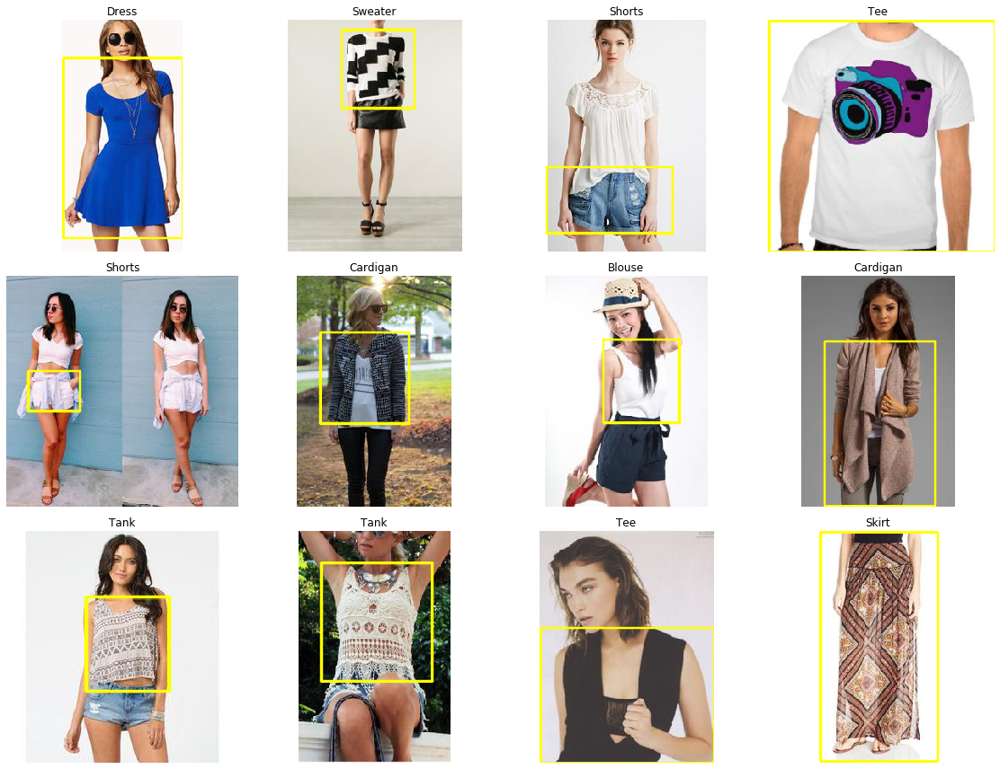

In [0]:
plot_df_images(df, 'image_path', 'category')

##### Cropping Images (for Inverse Image Search Model)

Images contain multiple items, so we crop arround bounding box.

In [0]:
df['new_id'] = range(1, 1 + len(df))

In [0]:
df['new_id'] = df['new_id'].map(str) + '.jpg'

In [0]:
df = df[df.evaluation_status == 'train']

In [0]:
df.head()

,evaluation_status,image_path,category,xmin,ymin,xmax,ymax,new_id,cropped_image_path,category_encoded
0,train,img/Braided_T-Back_Tank/img_00000066.jpg,Tank,111,92,195,266,1.jpg,data/fashion/train_cropped/1.jpg,10
1,train,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,Blouse,1,23,200,244,2.jpg,data/fashion/train_cropped/2.jpg,1
2,train,img/Mascot_Graphic_Tee/img_00000027.jpg,Tee,1,1,300,300,4.jpg,data/fashion/train_cropped/4.jpg,11
3,train,img/Botanical_Floral_Shift_Dress/img_00000071.jpg,Dress,32,34,94,219,5.jpg,data/fashion/train_cropped/5.jpg,3
4,train,img/Floral_Lace_Off-The-Shoulder_Dress/img_000...,Dress,28,33,177,254,8.jpg,data/fashion/train_cropped/8.jpg,3


In [0]:
def cropped(example, root_path, folder_path):
    f_image = Image.open('./data/fashion/' + example['image_path'])
    new_path = str(root_path) + str(folder_path) + example['new_id']
    width, height = f_image.size

    left = example['xmin'] - round((random.random() * 0.15 + 0.05) * (example['xmax'] - example['xmin']))
    top = example['ymin'] - round((random.random() * 0.15 + 0.05) * (example['ymax'] - example['ymin']))
    right = example['xmax'] + round((random.random() * 0.15 + 0.05) * (example['xmax'] - example['xmin']))
    bottom = example['ymax'] + round((random.random() * 0.15 + 0.05) * (example['ymax'] - example['ymin']))

    if left < 0: left = 0
    if right >= width: right = width
    if top < 0: top = 0
    if bottom >= height: bottom = height

    f_image = f_image.crop((left, top, right, bottom))
    f_image.save(new_path) 

    return new_path


In [0]:
def plot_cropped_images(dataset, path_col, label_col, n_rows=3, n_columns=4):
    f,ax = plt.subplots(n_rows ,n_columns, figsize=(4 * n_columns, 4 * n_rows))
    for i in range(n_rows*n_columns):
        idx = (i // n_columns, i % n_columns) if n_rows > 1 else i % n_columns

        rand_int = np.random.randint(len(dataset))

        image_row = dataset.iloc[rand_int]
        img_path = image_row[path_col]
        print(img_path)

        image = plt.imread(img_path)
 
        ax[idx].imshow(image)
        ax[idx].axis('off')
        ax[idx].set_title(image_row[label_col])
        plt.tight_layout()

In [0]:
df['cropped_image_path'] = df.apply(lambda row: cropped(row, str(DATA_DIR), '/train_cropped/'), axis=1)

data/fashion/train_cropped/89100.jpg
data/fashion/train_cropped/104601.jpg
data/fashion/train_cropped/216157.jpg
data/fashion/train_cropped/51262.jpg
data/fashion/train_cropped/183312.jpg
data/fashion/train_cropped/137779.jpg
data/fashion/train_cropped/102426.jpg
data/fashion/train_cropped/43977.jpg
data/fashion/train_cropped/170986.jpg
data/fashion/train_cropped/17908.jpg
data/fashion/train_cropped/69664.jpg
data/fashion/train_cropped/109734.jpg


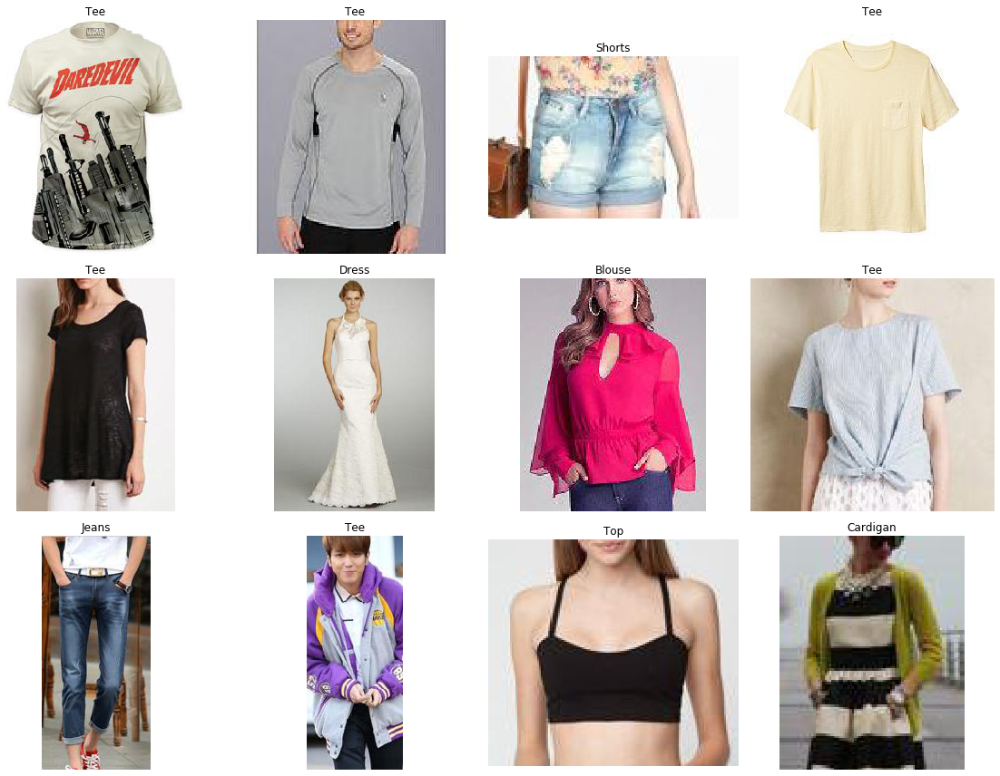

In [0]:
plot_cropped_images(df, 'cropped_image_path', 'category')

In [0]:
df.shape

(157376, 10)

In [0]:
# Adding clothing type name (top, bottom, full)
category_type_name_map = {1: 'top', 2 : 'bottom', 3: 'full'}

In [0]:
df['category_type_name'] = df.category_type_id.map(category_type_name_map)

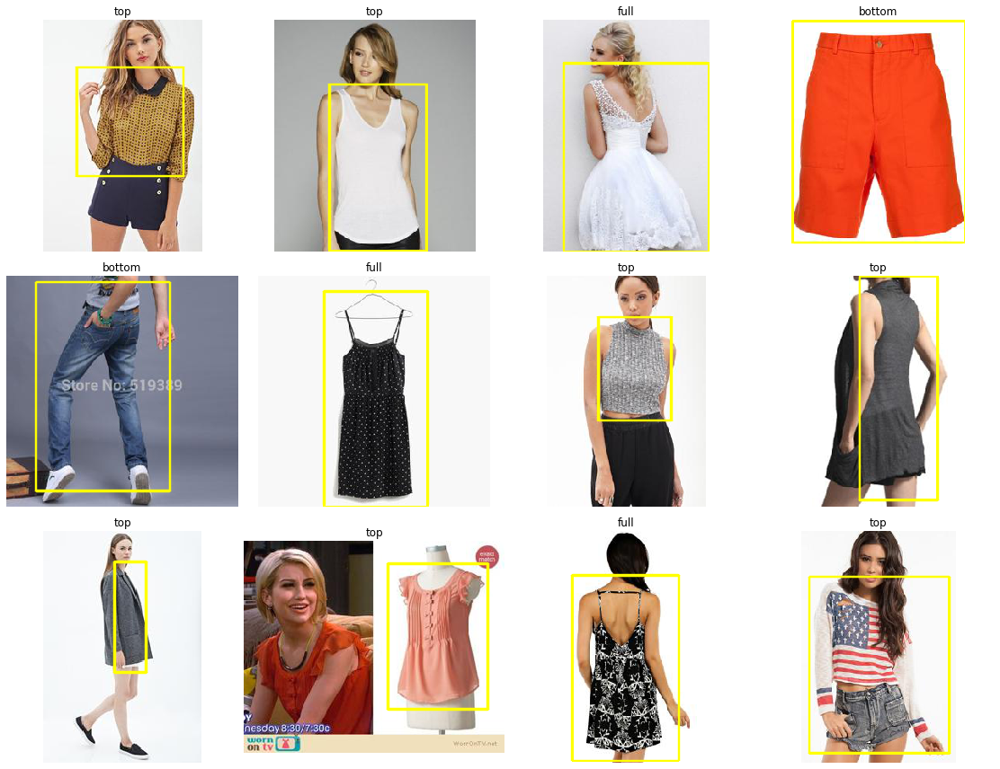

In [0]:
plot_df_images(df, 'image_path', 'category_type_name')

In [0]:
def get_image_dims(arr):
    heights, widths = [], []
    for filename in progress_bar(arr):
        height, width, _ = np.array(keras.preprocessing.image.load_img(filename)).shape
        heights.append(height)
        widths.append(width)
    return  np.asarray(widths),np.asarray(heights)

In [0]:
df[['width', 'height']] = pd.DataFrame(get_image_dims('./data/fashion/' + df['image_path'])).T


In [0]:
df.head()

,evaluation_status,image_path,category,xmin,ymin,xmax,ymax,new_id,cropped_image_path,category_encoded,category_type_id,category_type_name,width,height
0,train,img/Braided_T-Back_Tank/img_00000066.jpg,Tank,111,92,195,266,1.jpg,data/fashion/train_cropped/1.jpg,10,1,top,300,300
1,train,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,Blouse,1,23,200,244,2.jpg,data/fashion/train_cropped/2.jpg,1,1,top,200,300
2,train,img/Mascot_Graphic_Tee/img_00000027.jpg,Tee,1,1,300,300,4.jpg,data/fashion/train_cropped/4.jpg,11,1,top,300,300
3,train,img/Botanical_Floral_Shift_Dress/img_00000071.jpg,Dress,32,34,94,219,5.jpg,data/fashion/train_cropped/5.jpg,3,3,full,110,300
4,train,img/Floral_Lace_Off-The-Shoulder_Dress/img_000...,Dress,28,33,177,254,8.jpg,data/fashion/train_cropped/8.jpg,3,3,full,205,300


### 3rd Dataset - DeepFashion - In-shop Clothes Retrieval Dataset

This is a [large subset](http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion/InShopRetrieval.html) of DeepFashion, containing large pose and scale variations. It also has large diversities, large quantities, and rich annotations, including

7,982 number of clothing items;

52,712 number of in-shop clothes images, and ~200,000 cross-pose/scale pairs;

Each image is annotated by bounding box, clothing type and pose type.

There is one bounding box per image.

In [0]:
bbox_inshop = str(TEMP_DIR/'inshop/Anno/list_bbox_inshop.txt')

In [0]:
# Load bounding box labels
df_bbox = pd.read_csv(bbox_inshop, sep=r'\s{1,}', skiprows=2, engine='python', header=None, 
                       names=['image_path', 'clothes_type', 'pose_type', 'xmin', 'ymin', 'xmax', 'ymax'])

In [0]:
df_bbox.head()

,image_path,clothes_type,pose_type,xmin,ymin,xmax,ymax
0,img/WOMEN/Blouses_Shirts/id_00000001/02_1_fron...,1,1,50,49,208,235
1,img/WOMEN/Blouses_Shirts/id_00000001/02_2_side...,1,2,119,48,136,234
2,img/WOMEN/Blouses_Shirts/id_00000001/02_3_back...,1,3,50,42,213,240
3,img/WOMEN/Blouses_Shirts/id_00000001/02_4_full...,1,4,82,30,162,129
4,img/WOMEN/Dresses/id_00000002/02_1_front.jpg,3,1,65,45,233,252


In [0]:
len(dt_bbox)

52712

In [0]:
new = df_bbox['image_path'].str.split('/', expand = True)

In [0]:
new.head()

,0,1,2,3,4
0,img,WOMEN,Blouses_Shirts,id_00000001,02_1_front.jpg
1,img,WOMEN,Blouses_Shirts,id_00000001,02_2_side.jpg
2,img,WOMEN,Blouses_Shirts,id_00000001,02_3_back.jpg
3,img,WOMEN,Blouses_Shirts,id_00000001,02_4_full.jpg
4,img,WOMEN,Dresses,id_00000002,02_1_front.jpg


In [0]:
new.drop(columns =[0], inplace = True) 

In [0]:
new.rename(columns={1:'gender', 2:'category_name', 3:'image_id', 4:'file_name'}, inplace=True)

In [0]:
df_concat = pd.concat([dt_bbox, new], axis=1)

In [0]:
df_concat.head()

,image_path,clothes_type,pose_type,xmin,ymin,xmax,ymax,gender,category_name,image_id,file_name
0,img/WOMEN/Blouses_Shirts/id_00000001/02_1_fron...,1,1,50,49,208,235,WOMEN,Blouses_Shirts,id_00000001,02_1_front.jpg
1,img/WOMEN/Blouses_Shirts/id_00000001/02_2_side...,1,2,119,48,136,234,WOMEN,Blouses_Shirts,id_00000001,02_2_side.jpg
2,img/WOMEN/Blouses_Shirts/id_00000001/02_3_back...,1,3,50,42,213,240,WOMEN,Blouses_Shirts,id_00000001,02_3_back.jpg
3,img/WOMEN/Blouses_Shirts/id_00000001/02_4_full...,1,4,82,30,162,129,WOMEN,Blouses_Shirts,id_00000001,02_4_full.jpg
4,img/WOMEN/Dresses/id_00000002/02_1_front.jpg,3,1,65,45,233,252,WOMEN,Dresses,id_00000002,02_1_front.jpg


In [0]:
df_concat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52712 entries, 0 to 52711
Data columns (total 11 columns):
image_path       52712 non-null object
clothes_type     52712 non-null int64
pose_type        52712 non-null int64
xmin             52712 non-null int64
ymin             52712 non-null int64
xmax             52712 non-null int64
ymax             52712 non-null int64
gender           52712 non-null object
category_name    52712 non-null object
image_id         52712 non-null object
file_name        52712 non-null object
dtypes: int64(6), object(5)
memory usage: 4.4+ MB


In [0]:
df_concat_category_counts = df_concat.groupby(['category_name'])['image_path'].nunique().reset_index().sort_values(by=['image_path'], ascending=False)

In [0]:
df_concat_category_counts

,category_name,image_path
16,Tees_Tanks,14487
0,Blouses_Shirts,7964
3,Dresses,6999
11,Shorts,4476
14,Sweaters,3641
8,Pants,2821
12,Skirts,2045
5,Jackets_Coats,1895
9,Rompers_Jumpsuits,1696
15,Sweatshirts_Hoodies,1631


In [0]:
df_concat_category_counts_unique = df_concat.groupby(['category_name'])['image_id'].nunique().reset_index().sort_values(by=['image_id'], ascending=False)

In [0]:
df_concat_category_counts_unique

,category_name,image_id
16,Tees_Tanks,1720
0,Blouses_Shirts,1438
3,Dresses,1274
11,Shorts,598
14,Sweaters,533
8,Pants,421
5,Jackets_Coats,361
9,Rompers_Jumpsuits,327
4,Graphic_Tees,294
12,Skirts,288


In [0]:
df_concat.head()

,image_path,clothes_type,pose_type,xmin,ymin,xmax,ymax,gender,category_name,image_id,file_name,new_id,cropped_image_path
0,img/WOMEN/Blouses_Shirts/id_00000001/02_1_fron...,1,1,50,49,208,235,WOMEN,Blouses_Shirts,id_00000001,02_1_front.jpg,inshop_1.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
1,img/WOMEN/Blouses_Shirts/id_00000001/02_2_side...,1,2,119,48,136,234,WOMEN,Blouses_Shirts,id_00000001,02_2_side.jpg,inshop_2.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
2,img/WOMEN/Blouses_Shirts/id_00000001/02_3_back...,1,3,50,42,213,240,WOMEN,Blouses_Shirts,id_00000001,02_3_back.jpg,inshop_3.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
3,img/WOMEN/Blouses_Shirts/id_00000001/02_4_full...,1,4,82,30,162,129,WOMEN,Blouses_Shirts,id_00000001,02_4_full.jpg,inshop_4.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
4,img/WOMEN/Dresses/id_00000002/02_1_front.jpg,3,1,65,45,233,252,WOMEN,Dresses,id_00000002,02_1_front.jpg,inshop_5.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...


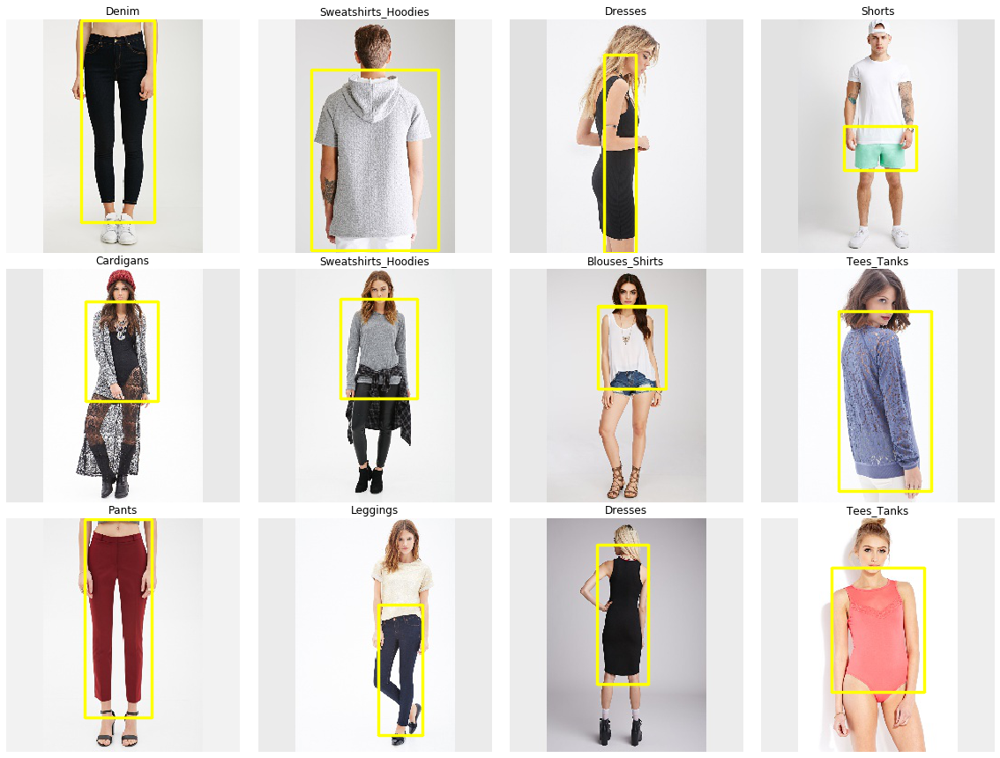

In [0]:
plot_df_images(df_concat, 'image_path', 'category_name')

In [0]:
df_concat['new_id'] = range(1, 1+len(df_concat))

In [0]:
df_concat['new_id'] = 'inshop_' + df_concat['new_id'].map(str) + '.jpg'

In [0]:
df_concat.head()

,image_path,clothes_type,pose_type,xmin,ymin,xmax,ymax,gender,category_name,image_id,file_name,new_id
0,img/WOMEN/Blouses_Shirts/id_00000001/02_1_fron...,1,1,50,49,208,235,WOMEN,Blouses_Shirts,id_00000001,02_1_front.jpg,inshop_1.jpg
1,img/WOMEN/Blouses_Shirts/id_00000001/02_2_side...,1,2,119,48,136,234,WOMEN,Blouses_Shirts,id_00000001,02_2_side.jpg,inshop_2.jpg
2,img/WOMEN/Blouses_Shirts/id_00000001/02_3_back...,1,3,50,42,213,240,WOMEN,Blouses_Shirts,id_00000001,02_3_back.jpg,inshop_3.jpg
3,img/WOMEN/Blouses_Shirts/id_00000001/02_4_full...,1,4,82,30,162,129,WOMEN,Blouses_Shirts,id_00000001,02_4_full.jpg,inshop_4.jpg
4,img/WOMEN/Dresses/id_00000002/02_1_front.jpg,3,1,65,45,233,252,WOMEN,Dresses,id_00000002,02_1_front.jpg,inshop_5.jpg


##### Chopping Off Images

Plotting images and bounding boxes showed, that bounding boxes for this dataset are not always correct. This is why we cannot crop this particular dataset based on bounding box . We will chop off the top part of the image for "bottom" item, and bottom part for "top" items.

In [0]:
def chop_off(example, root_path, orig_folder_path, dest_folder_path):
    mode=example['clothes_type']
    f_image = Image.open(str(root_path) + str(orig_folder_path) + example['image_path'])
    new_path = str(root_path) + str(dest_folder_path) + example['new_id']
    width, height = f_image.size
    if mode == 1:
        left = 0
        top = 0
        right = width
        bottom = example['ymax']

    elif mode == 2:
        left = 0
        top = example['ymin']
        right = width
        bottom = height

    else:
        left = 0
        top = 0
        right = width
        bottom = height


    f_image = f_image.crop((left, top, right, bottom))
    f_image.save(new_path) 

    return new_path

In [0]:
df_concat['cropped_image_path'] = df_concat.apply(lambda row: chop_off(row, str(DATA_DIR), '/inshop/', '/inshop/img_inshop_cropped/'), axis=1)

In [0]:
df_concat.head()

,image_path,clothes_type,pose_type,xmin,ymin,xmax,ymax,gender,category_name,image_id,file_name,new_id,cropped_image_path
0,img/WOMEN/Blouses_Shirts/id_00000001/02_1_fron...,1,1,50,49,208,235,WOMEN,Blouses_Shirts,id_00000001,02_1_front.jpg,inshop_1.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
1,img/WOMEN/Blouses_Shirts/id_00000001/02_2_side...,1,2,119,48,136,234,WOMEN,Blouses_Shirts,id_00000001,02_2_side.jpg,inshop_2.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
2,img/WOMEN/Blouses_Shirts/id_00000001/02_3_back...,1,3,50,42,213,240,WOMEN,Blouses_Shirts,id_00000001,02_3_back.jpg,inshop_3.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
3,img/WOMEN/Blouses_Shirts/id_00000001/02_4_full...,1,4,82,30,162,129,WOMEN,Blouses_Shirts,id_00000001,02_4_full.jpg,inshop_4.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...
4,img/WOMEN/Dresses/id_00000002/02_1_front.jpg,3,1,65,45,233,252,WOMEN,Dresses,id_00000002,02_1_front.jpg,inshop_5.jpg,data/fashion/inshop/img_inshop_cropped/inshop_...


data/fashion/inshop/img_inshop_cropped/inshop_23531.jpg
data/fashion/inshop/img_inshop_cropped/inshop_17987.jpg
data/fashion/inshop/img_inshop_cropped/inshop_20276.jpg
data/fashion/inshop/img_inshop_cropped/inshop_49223.jpg
data/fashion/inshop/img_inshop_cropped/inshop_256.jpg
data/fashion/inshop/img_inshop_cropped/inshop_28777.jpg
data/fashion/inshop/img_inshop_cropped/inshop_33174.jpg
data/fashion/inshop/img_inshop_cropped/inshop_23254.jpg
data/fashion/inshop/img_inshop_cropped/inshop_51927.jpg
data/fashion/inshop/img_inshop_cropped/inshop_40713.jpg
data/fashion/inshop/img_inshop_cropped/inshop_52593.jpg
data/fashion/inshop/img_inshop_cropped/inshop_29455.jpg
data/fashion/inshop/img_inshop_cropped/inshop_3642.jpg
data/fashion/inshop/img_inshop_cropped/inshop_563.jpg
data/fashion/inshop/img_inshop_cropped/inshop_40540.jpg


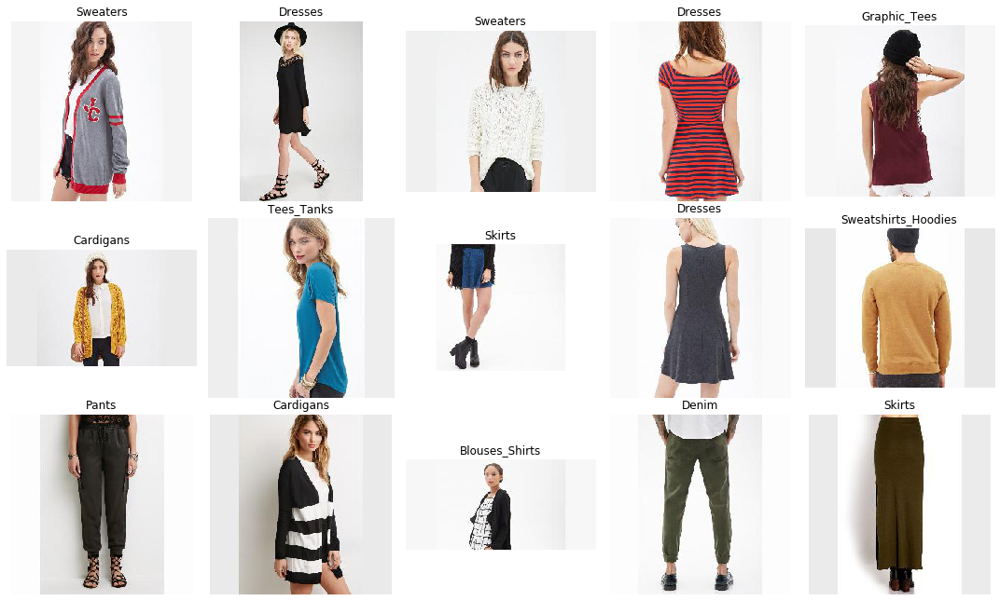

In [0]:
plot_cropped_images(df_concat, 'cropped_image_path', 'category_name')

### Preparing Data for Object Detector Model (combining deepfashion + deepfashion2)

We will combine samples from several datasets.

OD Model has to detect category type - top, bottom or full.

In [0]:
df.head()

,evaluation_status,image_path,category,xmin,ymin,xmax,ymax,new_id,cropped_image_path,category_encoded,category_type_id,category_type_name,width,height
0,train,img/Braided_T-Back_Tank/img_00000066.jpg,Tank,111,92,195,266,1.jpg,data/fashion/train_cropped/1.jpg,10,1,top,300,300
1,train,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,Blouse,1,23,200,244,2.jpg,data/fashion/train_cropped/2.jpg,1,1,top,200,300
2,train,img/Mascot_Graphic_Tee/img_00000027.jpg,Tee,1,1,300,300,4.jpg,data/fashion/train_cropped/4.jpg,11,1,top,300,300
3,train,img/Botanical_Floral_Shift_Dress/img_00000071.jpg,Dress,32,34,94,219,5.jpg,data/fashion/train_cropped/5.jpg,3,3,full,110,300
4,train,img/Floral_Lace_Off-The-Shoulder_Dress/img_000...,Dress,28,33,177,254,8.jpg,data/fashion/train_cropped/8.jpg,3,3,full,205,300


In [0]:
cat_type_map = df.set_index('category').to_dict()['category_type_id']
cat_type_map

{'Blazer': 1,
 'Blouse': 1,
 'Cardigan': 1,
 'Dress': 3,
 'Jacket': 1,
 'Jeans': 2,
 'Leggings': 2,
 'Shorts': 2,
 'Skirt': 2,
 'Sweater': 1,
 'Tank': 1,
 'Tee': 1,
 'Top': 1}

In [0]:
category_type_name_map = {1: 'top', 2 : 'bottom', 3: 'full'}

In [0]:
train_fin = pd.read_csv(TEMP_DIR/'train_fin.csv', low_memory=False)

In [0]:
train_fin.category_name.unique()

array(['Leggings', 'Blouse', 'Tank_Top', 'Jeans', 'Skirt', 'Lace_Shirt',
       'sling dress', 'vest', 'short sleeve dress', 'short sleeve top',
       'vest dress', 'trousers', 'long sleeve top', 'shorts', 'skirt',
       'long sleeve dress', 'long sleeve outwear'], dtype=object)

In [0]:
train_fin.groupby(['category_name', 'new_category_name'])['image_path'].count().reset_index()

,category_name,new_category_name,image_path
0,Blouse,Blouse,1597
1,Jeans,Jeans,967
2,Lace_Shirt,Lace_Shirt,7274
3,Leggings,Leggings,8123
4,Skirt,Skirt,2235
5,Tank_Top,Tank_Top,6680
6,long sleeve dress,Dress,1193
7,long sleeve outwear,long sleeve outwear,1641
8,long sleeve top,long sleeve top,4765
9,short sleeve dress,Dress,2463


In [0]:
train_fin_map = {'Blouse': 1,
 'Jeans': 2,
 'Lace_Shirt': 1,
 'Leggings': 2,
 'Skirt': 2,
 'Tank_Top': 1,
 'long sleeve dress': 3,
 'long sleeve outwear': 1,
 'long sleeve top': 1,
 'short sleeve dress': 3,
 'short sleeve top': 1,
 'shorts': 2,
 'skirt': 2,
 'sling dress': 3,
 'trousers': 2,
 'vest': 1,
 'vest dress': 3}

In [0]:
train_fin['category_type_id'] = train_fin.category_name.map(train_fin_map)

In [0]:
train_fin['category_type_name'] = train_fin.category_type_id.map(category_type_name_map)

In [0]:
cat_list_for_od = ['skirt','shorts', 'trousers']

In [0]:
dt = train_fin[train_fin.category_name.isin(cat_list_for_od)]

In [0]:
dt.groupby(['category_name', 'new_category_name', 'category_type_id'])['image_path'].count().reset_index()

,category_name,new_category_name,category_type_id,image_path
0,shorts,shorts,2,3203
1,skirt,Skirt,2,5349
2,trousers,trousers,2,7642


In [0]:
df.head(3)

,evaluation_status,image_path,category,xmin,ymin,xmax,ymax,new_id,cropped_image_path,category_encoded,category_type_id,category_type_name,width,height,index,new_category_name
0,train,img/Braided_T-Back_Tank/img_00000066.jpg,Tank,111,92,195,266,1.jpg,data/fashion/train_cropped/1.jpg,10,1,top,300,300,item1,Tank
1,train,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,Blouse,1,23,200,244,2.jpg,data/fashion/train_cropped/2.jpg,1,1,top,200,300,item1,Blouse
2,train,img/Mascot_Graphic_Tee/img_00000027.jpg,Tee,1,1,300,300,4.jpg,data/fashion/train_cropped/4.jpg,11,1,top,300,300,item1,Tee


In [0]:
dt_part = dt[['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'width', 'height',
       'index', 'category_name',
       'new_category_name', 'category_type_id',
       'category_type_name' ]]

In [0]:
dt_part.head()

,image_path,xmin,ymin,xmax,ymax,width,height,index,category_name,new_category_name,category_type_id,category_type_name
26894,validation/image/000015.jpg,243,203,300,338,468,351,item1,trousers,trousers,2,bottom
26899,validation/image/000020.jpg,66,516,332,828,468,830,item2,trousers,trousers,2,bottom
26904,validation/image/000024.jpg,164,416,336,602,468,624,item2,shorts,shorts,2,bottom
26908,validation/image/000027.jpg,0,0,623,467,624,468,item1,skirt,Skirt,2,bottom
26909,validation/image/000028.jpg,0,13,467,348,468,351,item1,skirt,Skirt,2,bottom


In [0]:
df_part = df[['image_path','xmin', 'ymin', 'xmax',
       'ymax', 'width', 'height','index','category','new_category_name', 'category_type_id', 'category_type_name', ]]

In [0]:
df_part.head()

,image_path,xmin,ymin,xmax,ymax,width,height,index,category_name,new_category_name,category_type_id,category_type_name
0,img/Braided_T-Back_Tank/img_00000066.jpg,111,92,195,266,300,300,item1,Tank,Tank,1,top
1,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,1,23,200,244,200,300,item1,Blouse,Blouse,1,top
2,img/Mascot_Graphic_Tee/img_00000027.jpg,1,1,300,300,300,300,item1,Tee,Tee,1,top
3,img/Botanical_Floral_Shift_Dress/img_00000071.jpg,32,34,94,219,110,300,item1,Dress,Dress,3,full
4,img/Floral_Lace_Off-The-Shoulder_Dress/img_000...,28,33,177,254,205,300,item1,Dress,Dress,3,full


In [0]:
df_fin = pd.concat([df_part, dt_part], sort=False)

In [0]:
# Final DataFrame for Object Decetor
df_fin.head()

,image_path,xmin,ymin,xmax,ymax,width,height,index,category_name,new_category_name,category_type_id,category_type_name
0,img/Braided_T-Back_Tank/img_00000066.jpg,111,92,195,266,300,300,item1,Tank,Tank,1,top
1,img/Floral_Printed_Side-Tie_Blouse/img_0000003...,1,23,200,244,200,300,item1,Blouse,Blouse,1,top
2,img/Mascot_Graphic_Tee/img_00000027.jpg,1,1,300,300,300,300,item1,Tee,Tee,1,top
3,img/Botanical_Floral_Shift_Dress/img_00000071.jpg,32,34,94,219,110,300,item1,Dress,Dress,3,full
4,img/Floral_Lace_Off-The-Shoulder_Dress/img_000...,28,33,177,254,205,300,item1,Dress,Dress,3,full


In [0]:
df_fin.groupby(['category_type_name', 'new_category_name'])['image_path'].count().reset_index()

,category_type_name,new_category_name,image_path
0,bottom,Jeans,5113
1,bottom,Leggings,3571
2,bottom,Shorts,14195
3,bottom,Skirt,16143
4,bottom,shorts,3203
5,bottom,trousers,7642
6,full,Dress,28745
7,top,Blazer,5408
8,top,Blouse,17752
9,top,Cardigan,9606


In [0]:
df_fin.groupby(['category_type_name'])['image_path'].count().reset_index()

,category_type_name,image_path
0,bottom,49867
1,full,28745
2,top,94958


#### Splitting - Train, Validation, Test

In [0]:
df_fin.shape

(173570, 12)

In [0]:
df_fin.category_name.nunique()

16

We split on "category_name" to have samples of each category for each category type (bottom, top, full). We split on category name because it is the name corresponding to the the original category name in each dataset. So we have samples from all datasets.

In [0]:
train_data, validation_data, test_data = split_df(df_fin, 0.6, 'category_name')

In [0]:
[x.shape for x in [train_data, validation_data, test_data]]

[(69428, 12), (52071, 12), (52071, 12)]

In [0]:
train_data, validation_data, test_data = split_df(train_data, 0.2, 'category_name')

In [0]:
[x.shape for x in [train_data, validation_data, test_data]]

[(55542, 12), (6943, 12), (6943, 12)]

#### Check Data Split

In [0]:
df_type_cats = df_fin.groupby(['category_type_id', 'category_name'])['image_path'].count().reset_index()

In [0]:
df_type_cats

,category_type_id,category_name,image_path
0,1,Blazer,5408
1,1,Blouse,17752
2,1,Cardigan,9606
3,1,Jacket,7548
4,1,Sweater,9517
5,1,Tank,11204
6,1,Tee,26653
7,1,Top,7270
8,2,Jeans,5113
9,2,Leggings,3571


In [0]:
df_type_cats['%'] = (df_type_cats['image_path']/df_type_cats.image_path.sum())*100

In [0]:
df_type_cats

,category_type_id,category_name,image_path,%
0,1,Blazer,5408,3.115746
1,1,Blouse,17752,10.227574
2,1,Cardigan,9606,5.534367
3,1,Jacket,7548,4.348678
4,1,Sweater,9517,5.483090
5,1,Tank,11204,6.455033
6,1,Tee,26653,15.355764
7,1,Top,7270,4.188512
8,2,Jeans,5113,2.945786
9,2,Leggings,3571,2.057383


In [0]:
train_cats = train_data.groupby(['category_type_id', 'category_name'])['image_path'].count().reset_index()

In [0]:
train_cats['%'] = (train_cats['image_path']/train_cats.image_path.sum())*100

In [0]:
train_cats

,category_type_id,category_name,image_path,%
0,1,Blazer,1730,3.114760
1,1,Blouse,5681,10.228296
2,1,Cardigan,3074,5.534550
3,1,Jacket,2415,4.348061
4,1,Sweater,3046,5.484138
5,1,Tank,3586,6.456375
6,1,Tee,8529,15.355947
7,1,Top,2326,4.187822
8,2,Jeans,1636,2.945519
9,2,Leggings,1142,2.056102


#### Make tf records

In [0]:
def create_tf_example(annotation, category_code_col, category_name_col, root_path=None):

    img_path = root_path + annotation['image_path']
    img_raw = open(img_path, 'rb').read()
    image_format = b'jpg'  # b'jpeg' or b'png'

    width = int(annotation['width'])
    height = int(annotation['height'])

    xmin = [annotation['xmin']/width]
    ymin = [annotation['ymin']/height]
    xmax = [annotation['xmax']/width]
    ymax = [annotation['ymax']/height]
    classes = [annotation[category_code_col]]
    classes_text = [annotation[category_name_col].encode('utf8')]

    example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width': tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/filename': tf.train.Feature(bytes_list=tf.train.BytesList(value=[
            annotation['image_path'].encode('utf8')])),
        'image/source_id': tf.train.Feature(bytes_list=tf.train.BytesList(value=[
            annotation['image_path'].encode('utf8')])),
        'image/encoded': tf.train.Feature(bytes_list=tf.train.BytesList(value=[img_raw])),
        'image/format': tf.train.Feature(bytes_list=tf.train.BytesList(value=['jpg'.encode('utf8')])),
        'image/object/bbox/xmin': tf.train.Feature(float_list=tf.train.FloatList(value=xmin)),
        'image/object/bbox/xmax': tf.train.Feature(float_list=tf.train.FloatList(value=xmax)),
        'image/object/bbox/ymin': tf.train.Feature(float_list=tf.train.FloatList(value=ymin)),
        'image/object/bbox/ymax': tf.train.Feature(float_list=tf.train.FloatList(value=ymax)),
        'image/object/class/text': tf.train.Feature(bytes_list=tf.train.BytesList(value=classes_text)),
        'image/object/class/label': tf.train.Feature(int64_list=tf.train.Int64List(value=classes)),

    }))
    return example

In [0]:
writer = tf.io.TFRecordWriter('/content/drive/My Drive/18_CP_Fashion/temp/fashion/train.tfrecord')

none_counter = 0
for irow, example in train_data.iterrows():
        tf_example = create_tf_example(example, 'category_type_id', 'category_type_name', root_path = './data/fashion/')
        if tf_example is not None:
            writer.write(tf_example.SerializeToString())
        else:
            none_counter += 1
print(f'Skipped: {none_counter}')
writer.close()

Skipped: 0


In [0]:
writer = tf.io.TFRecordWriter('/content/drive/My Drive/18_CP_Fashion/temp/fashion/val.tfrecord')

none_counter = 0
for irow, example in validation_data.iterrows():
        tf_example = create_tf_example(example, 'category_type_id', 'category_type_name', root_path = './data/fashion/')
        if tf_example is not None:
            writer.write(tf_example.SerializeToString())
        else:
            none_counter += 1
print(f'Skipped: {none_counter}')
writer.close()


Skipped: 0


In [0]:
writer = tf.io.TFRecordWriter('/content/drive/My Drive/18_CP_Fashion/temp/fashion/test.tfrecord')

none_counter = 0
for irow, example in test_data.iterrows():
        tf_example = create_tf_example(example, 'category_type_id', 'category_type_name', root_path = './data/fashion/')
        if tf_example is not None:
            writer.write(tf_example.SerializeToString())
        else:
            none_counter += 1
print(f'Skipped: {none_counter}')
writer.close()

Skipped: 0


## Object Dedection Model - Yolov3 implementation for Tensorflow

We use implementation of YoloV3 in TensorFlow 2.x provided by https://github.com/zzh8829/yolov3-tf2.

We made several trainings using different sets of datasets.

Only the best model is presented.

##### Clone and install dependencies

In [0]:
!git clone https://github.com/zzh8829/yolov3-tf2

##### Check Tensorflow version

In [0]:
%cd yolov3-tf2/
!ls

import tensorflow as tf
tf.__version__

/content/yolov3-tf2
checkpoints	 data		  README.md		train.py
colab_gpu.ipynb  detect.py	  requirements-gpu.txt	yolov3_tf2
conda-cpu.yml	 detect_video.py  requirements.txt
conda-gpu.yml	 docs		  setup.py
convert.py	 LICENSE	  tools


'2.1.0'

##### Convert Pretrained Darknet Weight

In [0]:
!wget https://pjreddie.com/media/files/yolov3.weights -O data/yolov3.weights
!python convert.py

--2020-02-18 07:43:31--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘data/yolov3.weights’

data/yolov3.weights 100%[===================>] 236.52M  22.3MB/s    in 11s     

2020-02-18 07:43:43 (20.9 MB/s) - ‘data/yolov3.weights’ saved [248007048/248007048]

2020-02-18 07:43:45.893866: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-18 07:43:45.893976: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or direct

##### Initialize Detector

In [0]:
import sys
from absl import app, logging, flags
from absl.flags import FLAGS

from yolov3_tf2.models import (
    YoloV3, YoloV3Tiny
)
from yolov3_tf2.dataset import transform_images, load_tfrecord_dataset
from yolov3_tf2.utils import draw_outputs

flags.DEFINE_string('classes', './data/coco.names', 'path to classes file')
flags.DEFINE_string('weights', './checkpoints/yolov3.tf',
                    'path to weights file')
flags.DEFINE_boolean('tiny', False, 'yolov3 or yolov3-tiny')
flags.DEFINE_integer('size', 416, 'resize images to')
flags.DEFINE_string('image', './data/girl.png', 'path to input image')
flags.DEFINE_string('tfrecord', None, 'tfrecord instead of image')
flags.DEFINE_string('output', './output.jpg', 'path to output image')
flags.DEFINE_integer('num_classes', 80, 'number of classes in the model')

app._run_init(['yolov3'], app.parse_flags_with_usage)

physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

##### Detect Image

weights loaded
classes loaded
time: 0.2495865821838379
detections:
	person, 0.9976139068603516, [0.21386385 0.07699877 0.73635054 0.9421995 ]
	laptop, 0.9009860157966614, [0.29053935 0.6784483  0.6650773  0.99495757]
	pottedplant, 0.7943141460418701, [0.7386423  0.50556046 0.98436564 0.99149674]
	cup, 0.6664179563522339, [0.64373404 0.8300081  0.7322946  0.99215144]


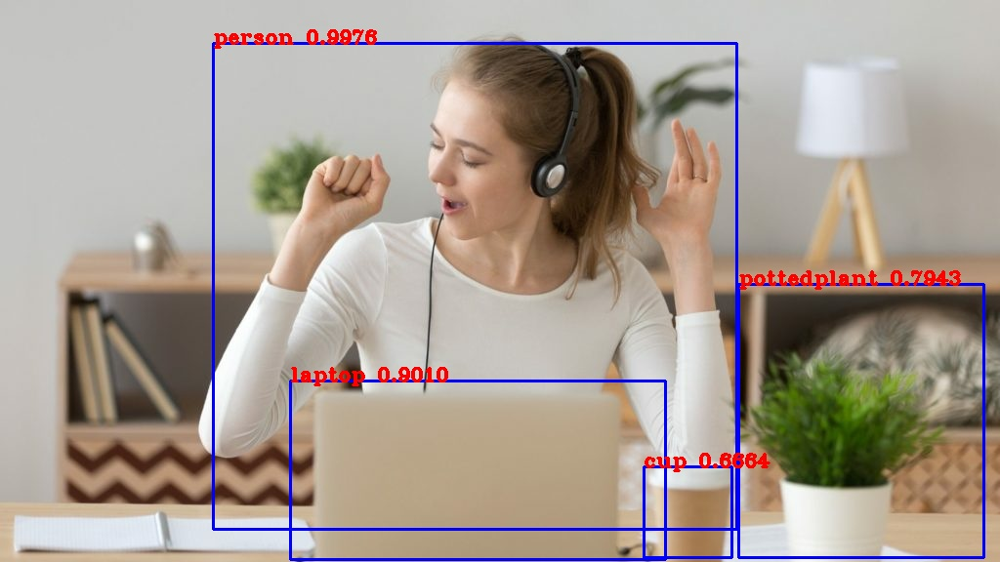

In [0]:
FLAGS.image = '/test_image.jpg'

if FLAGS.tiny:
    yolo = YoloV3Tiny(classes=FLAGS.num_classes)
else:
    yolo = YoloV3(classes=FLAGS.num_classes)
      
yolo.load_weights(FLAGS.weights).expect_partial()
print('weights loaded')

class_names = [c.strip() for c in open(FLAGS.classes).readlines()]
print('classes loaded')

img_raw = tf.image.decode_image(
    open(FLAGS.image, 'rb').read(), channels=3)

img = tf.expand_dims(img_raw, 0)
img = transform_images(img, FLAGS.size)

t1 = time.time()
boxes, scores, classes, nums = yolo(img)
t2 = time.time()
print('time: {}'.format(t2 - t1))

print('detections:')
for i in range(nums[0]):
    print('\t{}, {}, {}'.format(class_names[int(classes[0][i])],
                                        np.array(scores[0][i]),
                                        np.array(boxes[0][i])))

img = cv2.cvtColor(img_raw.numpy(), cv2.COLOR_RGB2BGR)
img = draw_outputs(img, (boxes, scores, classes, nums), class_names)

from IPython.display import Image, display
display(Image(data=bytes(cv2.imencode('.jpg', img)[1]), width=800))

##### Training New Dataset

In [0]:
!python tools/visualize_dataset.py \
    --dataset ./data/train.tfrecord \
    --classes=./data/fashion3.names

2020-02-18 07:47:30.290999: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-18 07:47:30.291106: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-18 07:47:30.291123: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
I0218 07:47:31.134730 139688806004608 visualize_dataset.py:22] classes loaded
2020-02-18 07:47:31.242261: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because t

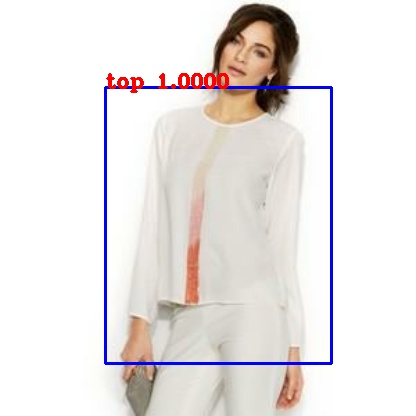

In [0]:
from IPython.display import Image
Image(filename='./output.jpg')

In [0]:
# Sanity check
img_path = '/content/data/fashion/' + df.iloc[0].image_path

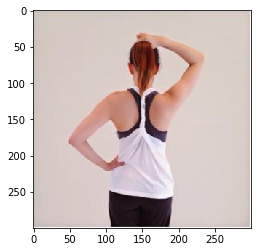

In [0]:
plt.imshow(plt.imread(img_path))

In [0]:
!python detect.py --image $img_path

2020-02-17 18:39:05.850860: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-17 18:39:05.851013: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-17 18:39:05.851038: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
I0217 18:39:14.239969 139969923827584 detect.py:35] weights loaded
I0217 18:39:14.240447 139969923827584 detect.py:38] classes loaded
I0217 18:39:16.089176 139969923827584 detect.py:55] time: 1.843128204345703

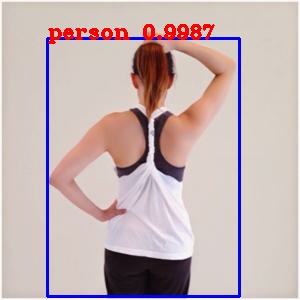

In [0]:
from IPython.display import Image
Image(filename='./output.jpg')

In [0]:
!python train.py \
	--dataset ./data/train.tfrecord \
	--val_dataset ./data/val.tfrecord \
	--classes ./data/fashion3.names \
	--num_classes 3 \
	--mode fit --transfer darknet \
	--batch_size 16 \
	--epochs 30 \
	--weights ./checkpoints/yolov3.tf \
	--weights_num_classes 80 

2020-02-18 09:58:59.091741: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-18 09:58:59.091836: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2020-02-18 09:58:59.091846: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Epoch 1/30
   3472/Unknown - 904s 261ms/step - loss: 35.6392 - yolo_output_0_loss: 3.4000 - yolo_output_1_loss: 5.4022 - yolo_output_2_loss: 16.25812020-02-18 10:14:17.701462: W tensorflow/core/common_runtime/

##### Detect using new weights

In [0]:
def draw_outputs_od(img_array, outputs, class_names):

    img = Image.fromarray(img_array)

    boxes, objectness, classes, nums = outputs
    boxes, objectness, classes, nums = boxes[0], objectness[0], classes[0], nums[0]
    wh = np.flip(img_array.shape[0:2])

    draw = ImageDraw.Draw(img)

    for i in range(nums):
        b = (boxes[i] * np.concatenate((wh, wh))).numpy().astype(np.int32)
        message = '{} {:.4f}'.format(class_names[int(classes[i])], objectness[i])

        draw.rectangle((b[0], b[1], b[2], b[3]), outline ='red', width=2) 
        
        draw.text((b[0], b[1] - 20), message, fill='blue', font=font)

    return img


In [0]:
def crop_od(image):
    img_raw = tf.image.decode_image(
    open(image, 'rb').read(), channels=3)

    img = tf.expand_dims(img_raw, 0)
    img = transform_images(img, FLAGS.size)

    boxes, scores, classes, nums = yolo(img)
    boxes, scores, classes, nums = boxes[0], scores[0], classes[0], nums[0]

    wh = np.flip(img_raw.numpy().shape[0:2])
    width = wh[0]
    height = wh[1]

    cropped_images = []

    for i in range(nums):
        b = (boxes[i] * np.concatenate((wh, wh))).numpy().astype(np.int32)
        
        left = b[0] - round((random.random() * 0.15 + 0.05) * (b[2]- b[0]))
        top = b[1] - round((random.random() * 0.15 + 0.05) * (b[3] - b[1]))
        right = b[2] + round((random.random() * 0.15 + 0.05) * (b[2] - b[0]))
        bottom = b[3] + round((random.random() * 0.15 + 0.05) * (b[3] - b[1]))

        if left < 0: left = 0
        if right >= width: right = width
        if top < 0: top = 0
        if bottom >= height: bottom = height

        img_to_crop =Image.fromarray(img_raw.numpy()).copy()

        cropped_image = img_to_crop.crop((b[0], b[1], b[2], b[3]))
        cropped_images.append(np.array(cropped_image))

    return cropped_images

In [0]:
def plot_pred_od(image):
    img_raw = tf.image.decode_image(
    open(image, 'rb').read(), channels=3)

    img = tf.expand_dims(img_raw, 0)
    img = transform_images(img, FLAGS.size)

    t1 = time.time()
    boxes, scores, classes, nums = yolo(img)
    t2 = time.time()
    logging.info('time: {}'.format(t2 - t1))

    print('detections:')
    for i in range(nums[0]):
        print('\t{}, {}, {}'.format(class_names[int(classes[0][i])],
                                            np.array(scores[0][i]),
                                            np.array(boxes[0][i])))

    img = draw_outputs_od(img_raw.numpy(), (boxes, scores, classes, nums), class_names)

    display(img)

In [0]:
FLAGS.num_classes = 3
FLAGS.classes = 'data/fashion3.names'
FLAGS.weights = 'checkpoints/yolov3_train_7.tf'
FLAGS.image = str(TEMP_DIR/'test_img_ood/03_1_front.jpg') 
str(TEMP_DIR/'test_img_ood/03_1_front.jpg')

FLAGS.yolo_iou_threshold = 0.1
FLAGS.yolo_score_threshold = 0.1

yolo = YoloV3(classes=FLAGS.num_classes)
yolo.load_weights(FLAGS.weights).expect_partial()
class_names = [c.strip() for c in open(FLAGS.classes).readlines()]

time: 0.23461532592773438
detections:
	top, 0.6626057624816895, [0.25980675 0.24049166 0.75066376 0.76295424]
	bottom, 0.3184559643268585, [0.23941156 0.600277   0.75793135 0.8728009 ]


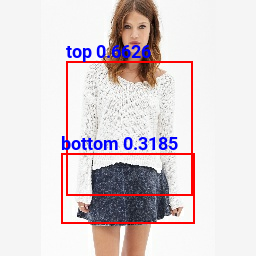

In [0]:
plot_pred_od(FLAGS.image)

In [0]:
list_img = sorted(os.listdir(str(TEMP_DIR/'test_img_od')))

time: 0.212493896484375
detections:
	bottom, 0.7699118852615356, [0.3398959  0.39281607 0.82853454 0.9033947 ]
	top, 0.23047484457492828, [0.274099   0.04873686 0.8543     0.50181335]


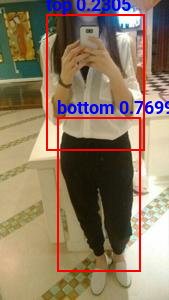

time: 0.20360279083251953
detections:
	bottom, 0.5916786789894104, [0.19427791 0.56885827 0.8481251  0.8850584 ]
	top, 0.1671352982521057, [0.20357716 0.26321203 0.8005755  0.60367763]


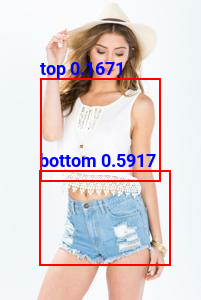

time: 0.21946334838867188
detections:
	full, 0.8650129437446594, [0.18345904 0.12740275 0.7822436  0.91731846]


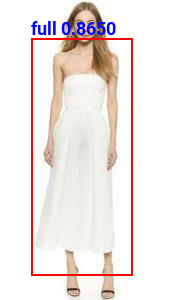

time: 0.2165508270263672
detections:
	bottom, 0.21815115213394165, [0.32783806 0.31998846 0.6618522  0.9694258 ]
	top, 0.13393907248973846, [0.28990573 0.17729634 0.67251843 0.40815562]


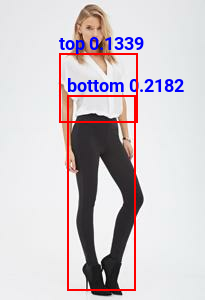

time: 0.22994756698608398
detections:
	full, 0.7667698264122009, [0.2758853  0.09818694 0.7472205  0.71334994]


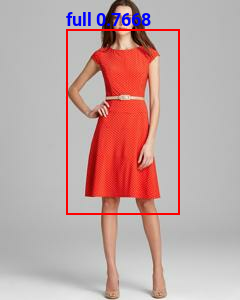

time: 0.22634172439575195
detections:
	bottom, 0.7322505116462708, [0.31688988 0.32777563 0.6776391  0.96013427]
	top, 0.13330921530723572, [0.32473195 0.14710146 0.66918755 0.3912443 ]


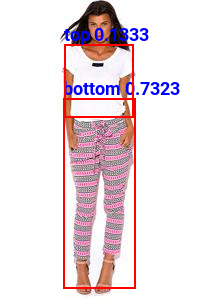

time: 0.21909427642822266
detections:
	top, 0.6507607102394104, [0.255278   0.1423165  0.785041   0.50795233]
	bottom, 0.44197726249694824, [0.28379324 0.4453048  0.783407   0.7574647 ]


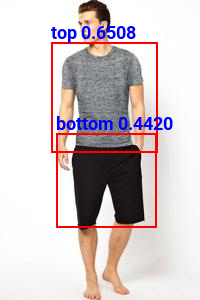

In [0]:
plotted= [plot_pred_od(str(TEMP_DIR/'test_img_ood/') + '/' + x) for x in list_img]

### Extracting Detected Items

In [0]:
image = str(TEMP_DIR/'test_img_ood/img_00000010.jpg')

time: 0.24039745330810547
detections:
	bottom, 0.5916786789894104, [0.19427791 0.56885827 0.8481251  0.8850584 ]
	top, 0.1671352982521057, [0.20357716 0.26321203 0.8005755  0.60367763]


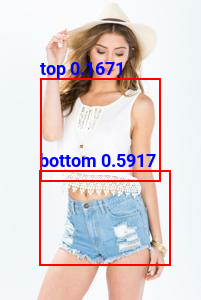

In [0]:
plot_pred_od(image)

In [0]:
cropped_img = crop_od(image)

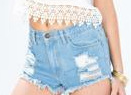

In [0]:
Image.fromarray(cropped_img[0])

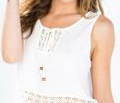

In [0]:
Image.fromarray(cropped_img[1])

## Inverse Image Search Model

We will use base pretrained model Xception and loss TripletSemiHardLoss.

We made several trainings using different parameters.

Only the best model is presented.

#### Data Preparation for IIS Model

In [0]:
train_data, validation_data, test_data = split_df(df_concat, 0.55, 'category_name')

In [0]:
[x.shape for x in [train_data, validation_data, test_data]]

[(68994, 10), (42164, 10), (42164, 10)]

In [0]:
train_data, validation_data, test_data = split_df(train_data, 0.2, 'category_name')

In [0]:
[x.shape for x in [train_data, validation_data, test_data]]

[(55195, 10), (6899, 10), (6900, 10)]

In [0]:
train_data.groupby(['new_category_name', 'new_cat_id'])['image_path'].nunique().reset_index()

,new_category_name,new_cat_id,image_path
0,Blazer,0,1947
1,Blouse,1,5657
2,Cardigan,2,3458
3,Dress,3,8547
4,Jacket,4,2718
5,Jeans,5,1841
6,Leggings,6,1286
7,Pants,13,1015
8,Shorts,7,6722
9,Skirt,8,4622


In [0]:
validation_data.groupby(['new_category_name', 'new_cat_id'])['image_path'].nunique().reset_index()

,new_category_name,new_cat_id,image_path
0,Blazer,0,244
1,Blouse,1,708
2,Cardigan,2,432
3,Dress,3,1068
4,Jacket,4,340
5,Jeans,5,230
6,Leggings,6,161
7,Pants,13,127
8,Shorts,7,840
9,Skirt,8,577


In [0]:
test_data.groupby(['new_category_name', 'new_cat_id'])['image_path'].nunique().reset_index()

,new_category_name,new_cat_id,image_path
0,Blazer,0,243
1,Blouse,1,707
2,Cardigan,2,433
3,Dress,3,1069
4,Jacket,4,339
5,Jeans,5,230
6,Leggings,6,160
7,Pants,13,127
8,Shorts,7,840
9,Skirt,8,578


In [0]:
IMG_DIMS = (299,299,3)
BATCH_SIZE = 32
SHUFFLE_SIZE = 1024

In [0]:
train_set = (
    tf.data.Dataset.from_tensor_slices(
        (
            train_data['cropped_image_path'],
            train_data['new_cat_id'].values,
        )
    )
    .map(ImageParser())
    .map(ImageResizer(IMG_DIMS, 'stretch'))
    .map(ImageAugmentor(level=3, rotate=False))
    .repeat()
    .shuffle(SHUFFLE_SIZE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.experimental.AUTOTUNE)
)

In [0]:
validation_set  = (
    tf.data.Dataset.from_tensor_slices(
        (
            validation_data['cropped_image_path'],
            validation_data['new_cat_id'].values,
        )
    )
    .map(ImageParser())
    .map(ImageResizer(IMG_DIMS, 'stretch'))
    .batch(BATCH_SIZE)
    .prefetch(tf.data.experimental.AUTOTUNE)
)

In [0]:
steps_per_epoch = math.ceil(train_data.shape[0]/BATCH_SIZE)

In [0]:
train_data.shape[0]

55195

In [0]:
train_data.new_cat_id.nunique()

14

In [0]:
n_classes = train_data.new_cat_id.nunique()

### Training IIS Model

In [0]:
learner = ImageLearner(
    path=TEMP_DIR/'xception_1',
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[],
    load=False,
    override=True,
)

In [0]:
learner.model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

In [0]:
learner.squeeze_layer = keras.layers.Dense(
    30,
    activation=keras.activations.relu,
    kernel_initializer=keras.initializers.he_uniform(),
)
learner.output_layer = keras.layers.Dense(
    n_classes, activation=keras.activations.softmax
)

In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=learner.output_layer(learner.squeeze_layer(learner.dropout_layer)),
)

In [0]:
learner.model.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.compile(optimizer=tf.keras.optimizers.Adam, lr=1e-4)

In [0]:
len(train_data)

55195

In [0]:
train_data_steps = math.ceil(len(train_data) / BATCH_SIZE)

In [0]:
train_data_steps

1725

In [0]:
validation_data_steps = math.ceil(len(validation_data) / BATCH_SIZE)

In [0]:
epochs = 3
reduce_lr_patience = max(2, epochs // 4)
early_stopping_patience = reduce_lr_patience * 2

history = learner.model.fit(
    x=train_set,
    steps_per_epoch=train_data_steps,

    validation_data=validation_set,
    validation_steps=validation_data_steps,
            epochs=3,
    verbose=1,
    callbacks=[
               keras.callbacks.ModelCheckpoint(
                   str(TEMP_DIR/'xception_1/weights.h5'), save_best_only=True, save_weights_only=True
                   ),
               keras.callbacks.ReduceLROnPlateau(
                   factor=0.3, patience=reduce_lr_patience
                ),
               keras.callbacks.EarlyStopping(
                   patience=early_stopping_patience, restore_best_weights=True
                   ),
               ], 
               )

Train for 1725 steps, validate for 216 steps
Epoch 1/3
1725/1725 [==============================] - 1246s 722ms/step - loss: 0.9632 - val_loss: 0.7722
Epoch 2/3
1725/1725 [==============================] - 1230s 713ms/step - loss: 0.6583 - val_loss: 0.7392
Epoch 3/3
1725/1725 [==============================] - 1229s 712ms/step - loss: 0.5014 - val_loss: 0.7992


In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=learner.squeeze_layer(learner.dropout_layer),
)

In [0]:
learner.model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
def show_distances(
    xs, ys, target_index, similar_indices, distances, cols: int = 4, debug: bool = False
):
    if cols >= len(distances) + 1:
        cols = len(distances) + 1
        rows = 1
    else:
        rows = math.ceil((len(distances) + 1) / cols)

    figsize = (3 * cols, 3 * rows) if debug else (3 * cols, 3 * rows)
    _, ax = plt.subplots(rows, cols, figsize=figsize)

    i = 0
    for x, y, distance in zip(
        xs[[target_index] + similar_indices],
        ys[[target_index] + similar_indices],
        [0] + distances,
    ):
        idx = (i // cols, i % cols) if rows > 1 else i % cols
        ax[idx].axis('off')
        ax[idx].imshow(x)
        title = f'Label: {y}\nShape: {x.shape}\n' if debug else f'{y}\n{distance:.2f}'
        ax[idx].set_title(title)
        i += 1
        plt.tight_layout()

In [0]:
learner.compile(optimizer=tf.keras.optimizers.Adam, lr=1e-4)

In [0]:
images = [x.numpy() for x, _ in validation_set.unbatch()]

In [0]:
len(images)

6899

In [0]:
label_code = [category.numpy() for _, category in validation_set.unbatch()]


In [0]:
label_code[1]

11

In [0]:
new_label_map

{'Blazer': 0,
 'Blouse': 1,
 'Cardigan': 2,
 'Dress': 3,
 'Jacket': 4,
 'Jeans': 5,
 'Leggings': 6,
 'Pants': 13,
 'Shorts': 7,
 'Skirt': 8,
 'Sweater': 9,
 'Tank': 10,
 'Tee': 11,
 'Top': 12}

In [0]:
new_images = np.array(images)

In [0]:
new_images.shape

(6899, 299, 299, 3)

In [0]:
new_label_code = np.array(label_code)

In [0]:
np.save(TEMP_DIR/'cropped_set_images.npy', new_images)

In [0]:
np.save(TEMP_DIR/'cropped_set_new_label_code.npy', new_label_code)

In [0]:
new_images = np.load(TEMP_DIR/'cropped_set_images.npy')

In [0]:
new_label_code = np.load(TEMP_DIR/'cropped_set_new_label_code.npy')

### First Training Predictions

In [0]:
image_embeddings = learner.model.predict(new_images)

In [0]:
image_embeddings.shape

(6899, 30)

In [0]:
nbrs = sk.neighbors.NearestNeighbors(n_neighbors=11, algorithm='ball_tree').fit(
    image_embeddings
)

In [0]:
# new_image_index = np.random.randint(len(new_label_code))

In [0]:
new_image_index = 6881

In [0]:
new_prepared_image = new_images[new_image_index : new_image_index + 1]

In [0]:
new_image_embeddings = learner.model.predict(new_prepared_image)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

In [0]:
distances[0].tolist(), indices[0].tolist()

([4.8412953140111794e-06,
  2.3205166534550665,
  2.4745959307389858,
  3.198994505416872,
  3.2460066554114673,
  3.263423201500055,
  3.2775976036130228,
  3.296986308056069,
  3.316511245322135,
  3.4279635765540784,
  3.5033864214613835],
 [6881, 6844, 6681, 6749, 3603, 5734, 6768, 6038, 6864, 817, 3167])

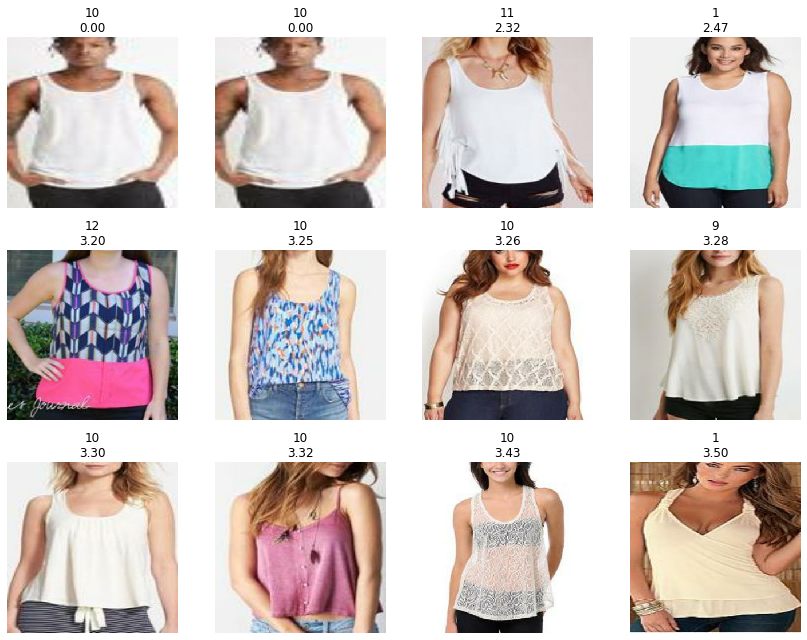

In [0]:
show_distances(
    new_images,
    new_label_code,
    new_image_index,
    indices[0].tolist(),
    distances[0].tolist(),
)

In [0]:
new_image_index = 6197

In [0]:
new_prepared_image = new_images[new_image_index : new_image_index + 1]

In [0]:
new_image_embeddings = learner.model.predict(new_prepared_image)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

In [0]:
distances[0].tolist(), indices[0].tolist()

([1.037429073168775e-05,
  4.505422398544999,
  4.732825378312874,
  4.836835922900822,
  4.942065539947033,
  5.107891921814271,
  5.297270789907504,
  5.36252812799253,
  5.370504513270676,
  5.580005377902271,
  5.58375812020317],
 [6197, 4793, 4863, 409, 5467, 6009, 6257, 5778, 3088, 4524, 3205])

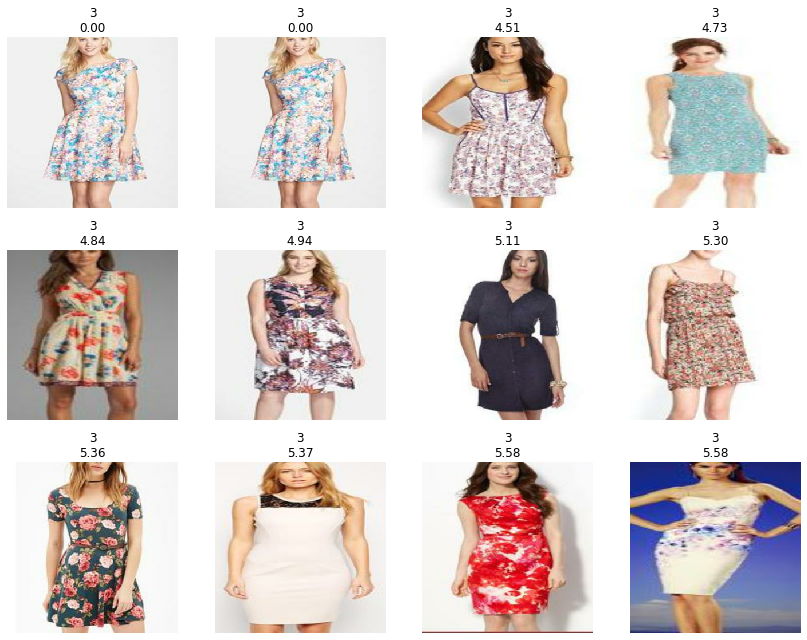

In [0]:
show_distances(
    new_images,
    new_label_code,
    new_image_index,
    indices[0].tolist(),
    distances[0].tolist(),
)

In [0]:
new_image_index = 2711

In [0]:
new_prepared_image = new_images[new_image_index : new_image_index + 1]

In [0]:
new_image_embeddings = learner.model.predict(new_prepared_image)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

In [0]:
distances[0].tolist(), indices[0].tolist()

([6.876526671571533e-06,
  3.8356518754216933,
  4.12436944828456,
  5.116181560337492,
  5.297494458248833,
  5.321193173299995,
  5.422498164689754,
  5.762962430845528,
  5.793516798187381,
  5.814659109511334,
  5.88868268663143],
 [2711, 3858, 2173, 500, 423, 5923, 2133, 807, 5993, 872, 3076])

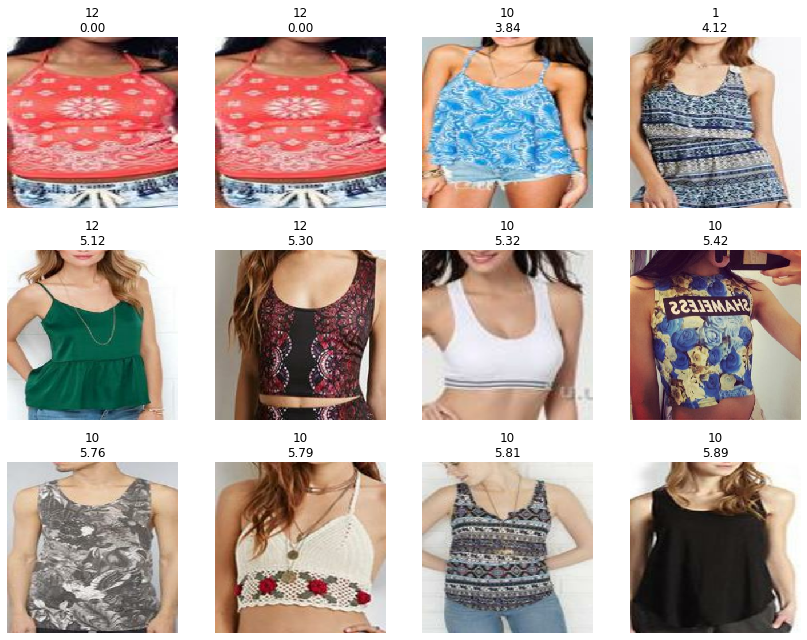

In [0]:
show_distances(
    new_images,
    new_label_code,
    new_image_index,
    indices[0].tolist(),
    distances[0].tolist(),
)

### Using TripletSemiHardLoss

In [0]:
learner.loss = tfa.losses.TripletSemiHardLoss()

In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(
        keras.layers.Dense(30, activation=None)(learner.concat_layer)
    ),
)

In [0]:
learner.model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.compile(optimizer=tf.keras.optimizers.Adam, lr=1e-4)

In [0]:
epochs = 5
reduce_lr_patience = max(2, epochs // 4)
early_stopping_patience = reduce_lr_patience * 2

history = learner.model.fit(
    x=train_set,
    steps_per_epoch=train_data_steps,

    validation_data=validation_set,
    validation_steps=validation_data_steps,
            epochs=5,
    verbose=1,
    callbacks=[
               keras.callbacks.ModelCheckpoint(
                   str(TEMP_DIR/'xception_1/weights_trl.h5'), save_best_only=True, save_weights_only=True
                   ),
               keras.callbacks.ReduceLROnPlateau(
                   factor=0.3, patience=reduce_lr_patience
                ),
               keras.callbacks.EarlyStopping(
                   patience=early_stopping_patience, restore_best_weights=True
                   ),
               ], 
               )

Train for 1725 steps, validate for 216 steps
Epoch 1/5
1725/1725 [==============================] - 1243s 720ms/step - loss: 0.3882 - val_loss: 0.4748
Epoch 2/5
1725/1725 [==============================] - 1232s 714ms/step - loss: 0.3015 - val_loss: 0.4606
Epoch 3/5
1725/1725 [==============================] - 1231s 713ms/step - loss: 0.2673 - val_loss: 0.4614
Epoch 4/5
1725/1725 [==============================] - 1232s 714ms/step - loss: 0.2336 - val_loss: 0.4496
Epoch 5/5
1725/1725 [==============================] - 1230s 713ms/step - loss: 0.2115 - val_loss: 0.4828


In [0]:
epochs = 5
reduce_lr_patience = max(2, epochs // 4)
early_stopping_patience = reduce_lr_patience * 2

# 30 model 10
history = learner.model.fit(
    x=train_set,
    steps_per_epoch=train_data_steps,

    validation_data=validation_set,
    validation_steps=validation_data_steps,
            epochs=5,
    verbose=1,
    callbacks=[
               keras.callbacks.ModelCheckpoint(
                   str(TEMP_DIR/'xception_1/weights_trl.h5'), save_best_only=True, save_weights_only=True
                   ),
               keras.callbacks.ReduceLROnPlateau(
                   factor=0.3, patience=reduce_lr_patience
                ),
               keras.callbacks.EarlyStopping(
                   patience=early_stopping_patience, restore_best_weights=True
                   ),
               ], 
               )

Train for 1725 steps, validate for 216 steps
Epoch 1/5
1725/1725 [==============================] - 1236s 716ms/step - loss: 0.1925 - val_loss: 0.4805
Epoch 2/5
1725/1725 [==============================] - 1232s 714ms/step - loss: 0.1812 - val_loss: 0.4366
Epoch 3/5
1725/1725 [==============================] - 1231s 714ms/step - loss: 0.1596 - val_loss: 0.4922
Epoch 4/5
1725/1725 [==============================] - 1230s 713ms/step - loss: 0.1562 - val_loss: 0.4602
Epoch 5/5
1725/1725 [==============================] - 1230s 713ms/step - loss: 0.1078 - val_loss: 0.4431


In [0]:
model_json = learner.model.to_json()
with open(str(TEMP_DIR/'xception_1/model_x1_30.json'), 'w') as json_file:
    json_file.write(model_json)

## OD + IIS

In [0]:
# Get the IIS Model architecture
json_file = open(str(TEMP_DIR/'xception_1/model_x1_30.json'))
loaded_model_json = json_file.read()
json_file.close()
loaded_model = tf.keras.models.model_from_json(loaded_model_json)

# Get weights
loaded_model.load_weights( str(TEMP_DIR/'xception_1/weights_trl.h5'))

In [0]:
loaded_model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                     loss=tfa.losses.TripletSemiHardLoss(),)

In [0]:
def preprocess_input_from_file(image, img_dims: Tuple[int, int, int], n_channels: int = 3, from_path=False):
    
    if from_path:
        image = tf.io.read_file(image)
        image = tf.image.decode_jpeg(image, channels=n_channels)
    
    image = tf.image.convert_image_dtype(image, tf.float32)

    height, width, _ = img_dims

    image = tf.image.resize(image, (height, width)).numpy()
    image = image[np.newaxis, :]

    return image


In [0]:
def show_distances_test(
    model, xs, ys, test_img,  cols: int = 5, test_from_path=False, db_from_path = True
):

    new_prep_img = preprocess_input_from_file(test_img, img_dims=IMG_DIMS, from_path=test_from_path)
    new_image_emb = model.predict(new_prep_img)
    dist, ind = nbrs.kneighbors(new_image_emb)
    similar_indices= ind[0].tolist()
    distances = dist[0].tolist()

    if cols >= len(distances) + 1:
        cols = len(distances) + 1
        rows = 1
    else:
        rows = math.ceil((len(distances)) / cols)
 
    figsize = (2 * cols, 3 * rows)
    _, ax = plt.subplots(rows, cols, figsize=figsize)

    i = 1

    if test_from_path:
        test_img = plt.imread(test_img)

    for  x, y, distance in zip(
        xs[similar_indices],
        ys[similar_indices],
       distances,
    ):
        if db_from_path:
            x = plt.imread(x)
        ax[0,0].imshow(test_img)
        ax[0,0].axis('off')
        ax[0,0].set_title('Original')
        idx = (i // cols, i % cols) if rows > 1 else i % cols
        ax[idx].axis('off')
        ax[idx].imshow(x)

        title = f'{y}\n{distance:.2f}'
        ax[idx].set_title(title)
        i += 1
        plt.tight_layout()

In [0]:
def det_crop(test_img, images_paths, category_names):
    plot_pred_od(test_img)
    cropped_test_img = crop_od(test_img)
    for img in cropped_test_img:
        show_distances_test(
        loaded_model,
        images_paths,
        category_names,
        img,
    )

### Preparing Test Dataset

In [0]:
test_data.shape

(6900, 11)

In [0]:
test_data.head()

,image_path,category_name,xmin,ymin,xmax,ymax,new_id,cropped_image_path,new_category_name,new_cat_id,set
0,img/MEN/Sweaters/id_00005876/01_1_front.jpg,Sweaters,90,32,178,134,inshop_38839.jpg,data/fashion/inshop_cropped/inshop_38839.jpg,Sweater,9,inshop
1,img/Space_Dye_Shorts/img_00000012.jpg,Shorts,36,6,170,69,167399.jpg,data/fashion/train_cropped/167399.jpg,Shorts,7,cat_attr
2,img/Easy_Open-Knit_Cardigan/img_00000014.jpg,Cardigan,25,64,186,275,109600.jpg,data/fashion/train_cropped/109600.jpg,Cardigan,2,cat_attr
3,img/Athletic_Mesh_Sports_Tank/img_00000060.jpg,Tank,59,54,172,241,186135.jpg,data/fashion/train_cropped/186135.jpg,Tank,10,cat_attr
4,img/Glasses_Print_Tee/img_00000003.jpg,Tee,1,9,230,277,777.jpg,data/fashion/train_cropped/777.jpg,Tee,11,cat_attr


In [0]:
test_set  = (
    tf.data.Dataset.from_tensor_slices(
        (
            test_data['image_path'],
            test_data['new_cat_id'].values,
        )
    )
    .map(ImageParser())
    .map(ImageResizer(IMG_DIMS, 'stretch'))
    .batch(BATCH_SIZE)
    .prefetch(tf.data.experimental.AUTOTUNE)
)

In [0]:
images = [x.numpy() for x, _ in test_set.unbatch()]

In [0]:
label_code = [category.numpy() for _, category in test_set.unbatch()]

In [0]:
new_images = np.array(images)

In [0]:
new_images.shape

(6900, 299, 299, 3)

In [0]:
new_label_code = np.array(label_code)

In [0]:
np.save(TEMP_DIR/'test_images.npy', new_images)

In [0]:
np.save(TEMP_DIR/'test_labels.npy', new_label_code)

In [0]:
new_images = np.load(TEMP_DIR/'test_images.npy')

In [0]:
new_label_code = np.load(TEMP_DIR/'test_labels.npy')

### IIS Predictions on Test Image Using Test Dataset

In [0]:
image_embeddings = loaded_model.predict(new_images)

In [0]:
nbrs = sk.neighbors.NearestNeighbors(n_neighbors=9, algorithm='ball_tree').fit(image_embeddings)

In [0]:
imgs = [(str(TEMP_DIR/'test_img_iis/') + '/') + x for x in sorted(os.listdir(TEMP_DIR/'test_img_iis/'))]

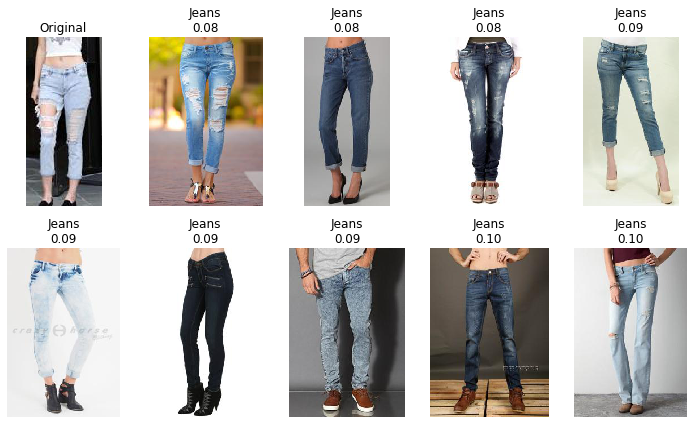

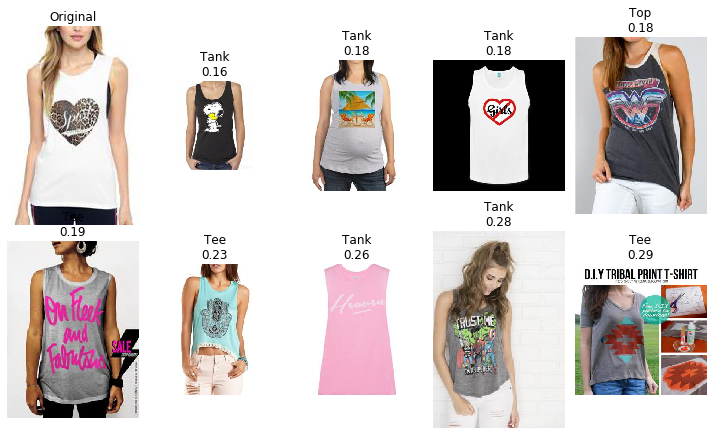

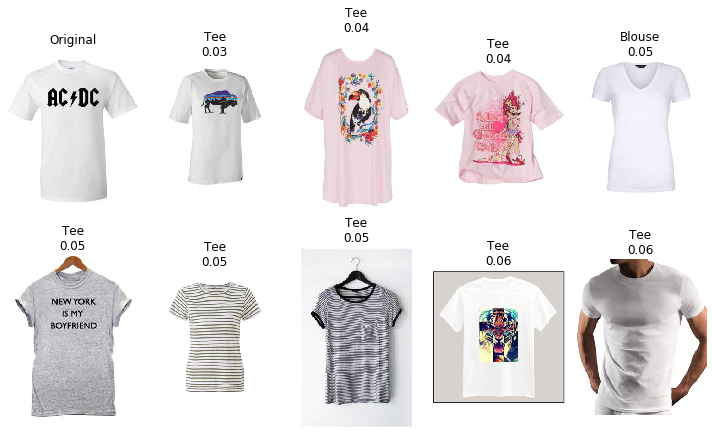

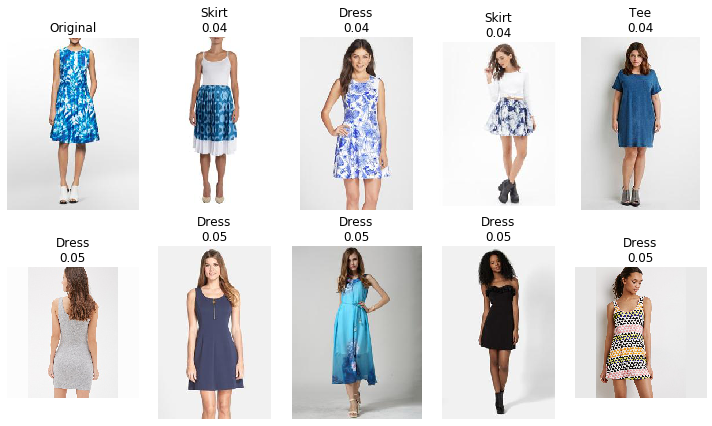

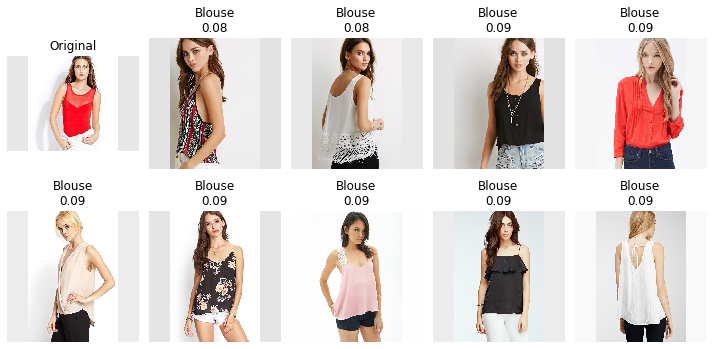

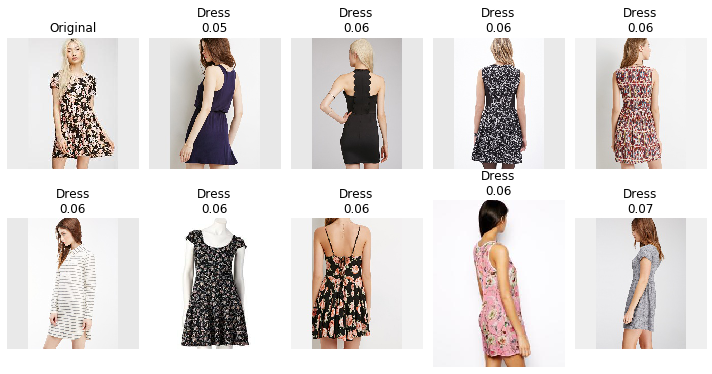

In [0]:
for img in imgs:
    show_distances_test(
    loaded_model,
    test_data.fin_image_path,
    test_data.new_category_name,
    img,
    test_from_path = True,
    db_from_path = True
)

### Object Detection and Inverse Image Search

In [0]:
test_img = str(TEMP_DIR/'test_img_fin/fin_1.jpg')

detections:
	bottom, 0.5916786789894104, [0.19427791 0.56885827 0.8481251  0.8850584 ]
	top, 0.1671352982521057, [0.20357716 0.26321203 0.8005755  0.60367763]


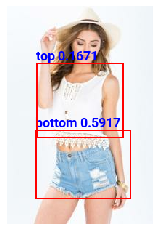

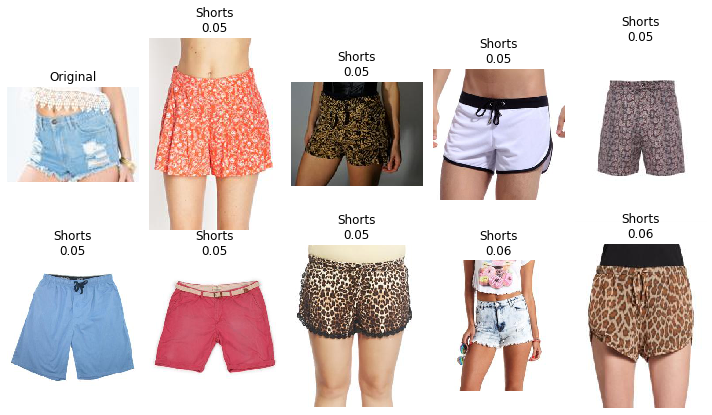

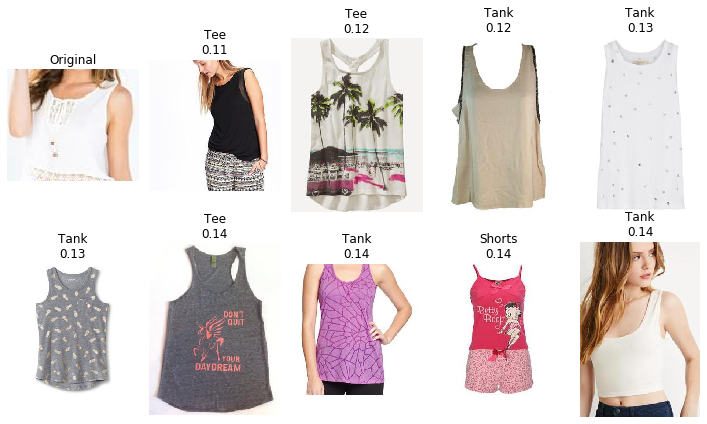

In [0]:
det_crop(test_img, test_data.fin_image_path, test_data.new_category_name)

In [0]:
test_img = str(TEMP_DIR/'test_img_fin/fin_2.jpg')

detections:
	bottom, 0.7322505116462708, [0.31688988 0.32777563 0.6776391  0.96013427]
	top, 0.13330921530723572, [0.32473195 0.14710146 0.66918755 0.3912443 ]


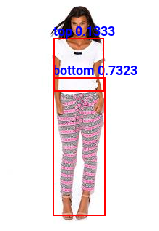

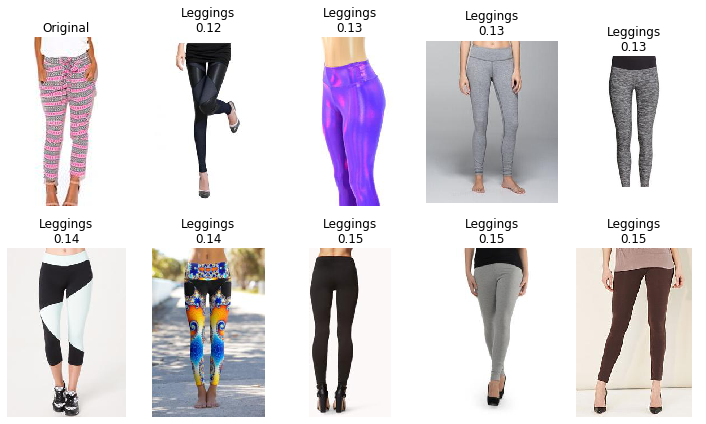

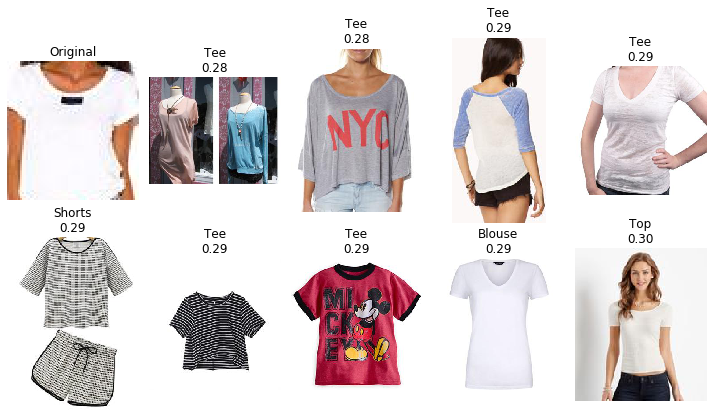

In [0]:
det_crop(test_img, test_data.fin_image_path, test_data.new_category_name,)

In [0]:
test_img = str(TEMP_DIR/'test_img_fin/fin_3.jpg')

detections:
	full, 0.9000335335731506, [0.3039134 0.0994924 0.7346857 1.       ]


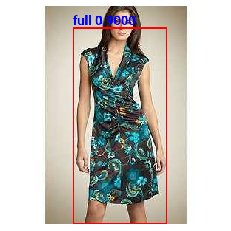

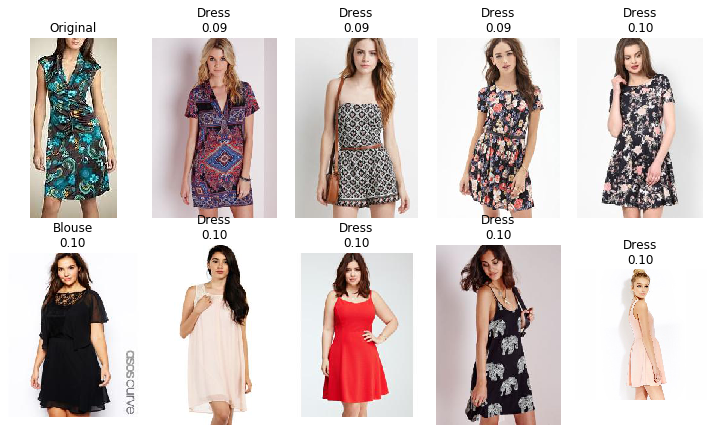

In [0]:
det_crop(test_img, test_data.fin_image_path, test_data.new_category_name)